# Predictive Equipment Failures 

## 1. Introduction

Organization will use Stripper Well Equipment’s to produce the oils at the well level. Due to low operation cost maintenance on equipment’s, Organization will get a prominent profit on oil production. However, Equipment’s will subject to fail (breakdown) due to Stripper Rubber shrinks, oil colour change, Feed gas temperature increase/decrease etc.,

Any unplanned downtime of equipment would degrade or interrupt a company’s core business, potentially resulting in significant penalties and unmeasurable reputation loss.


## 1.1 Business Problem

Predict the asset failures upfront. Such that, based on the prediction, Organization will send crew to Physical Locations to fix the equipment or send a replacement equipment before fail which will rapidly decrease the downtime of equipment’s and also helps to reduce the operational cost drastically and increase the revenue to the Organization.

## 1.2 Business Objectives and Constraints

* No Low Latency requirement. But latency should not be more than 5 minutes
* Errors can be very costly

## 1.3 Sources / Useful Links

* Some of the useful research papers related to Machine Learning approach for Predictive Maintenance are as follows 

    1.https://www.researchgate.net/publication/327334242_Machine_Learning_approach_for_Predictive_Maintenance_in_Industry_40

    2.https://www.mdpi.com/2071-1050/12/19/8211

    3.https://www.sciencedirect.com/science/article/pii/S2212827118312988

## 1.4 About Dataset Analysis

Below are the provided datasets 

Dataset | Description 
----------|---------------
**`equip_failures_training_set.csv `** | The training dataset. This document contains history of asset failures. This dataset contains “Target” feature information. “Target” feature represents whether the equipment failure happened in downhole or surface.    
**`equip_failures_test_set.csv `**    | The test set. This dataset doesn’t contain Target feature information. We must apply ML algorithms and predict the target. 

Below are the features across datasets 

Feature | Description 
----------|---------------
**`Id`** | Row Identifier   
**`Target `**    | Refers to downhole or surface equipment failure <br><ul><li><code>Target value 1 refers to downhole failures</code></li><li><code>Target value 0 refers to surface failures</code></li></ul> 
**`Measure Columns`** | Single Measurement Sensors data. Data is captured from 100 sensors. There are  100 columns information available in the dataset
**`Histogram Bin Columns`**    | Refers to bins of a sensor that show its distribution over time. There are 70 columns belongs to Histogram bin

# 2. Mapping problem in to Supervised Learning Problem:

In [1]:
# import supported libraries
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas import DataFrame
import operator
from tqdm import tqdm 
from sklearn import preprocessing
from sklearn.datasets import load_digits
from sklearn.feature_selection import SelectKBest, chi2
from scipy.stats import boxcox
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix

## 2.1 Reading Data 

In [2]:
EquipFail_train_dataset = pd.read_csv('equip_failures_training_set.csv')
print ("Total number of Training dataset records are (Rows X Columns):", EquipFail_train_dataset.shape)

Total number of Training dataset records are (Rows X Columns): (60000, 172)


In [3]:
#EquipFail_test_dataset = pd.read_csv('equip_failures_test_set.csv')
#print ("Total number of Test dataset records are (Rows X Columns):", EquipFail_test_dataset.shape)

<b>Observation: </b>

Due to "Target" feature doesn't exists in Test data set, total number of columns are shown as 171.

In [4]:
EquipFail_train_dataset.head(5)

,id,target,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,1,0,76698,na,2130706438,280,0,0,0,0,...,1240520,493384,721044,469792,339156,157956,73224,0,0,0
1,2,0,33058,na,0,na,0,0,0,0,...,421400,178064,293306,245416,133654,81140,97576,1500,0,0
2,3,0,41040,na,228,100,0,0,0,0,...,277378,159812,423992,409564,320746,158022,95128,514,0,0
3,4,0,12,0,70,66,0,10,0,0,...,240,46,58,44,10,0,0,0,4,32
4,5,0,60874,na,1368,458,0,0,0,0,...,622012,229790,405298,347188,286954,311560,433954,1218,0,0


<b>Observation: </b> 

Each Row / Data point is a failure event. For each failure event, data has been collected from 107 sensors that collect a variety of physical information both on the surface and below the ground.

Noticed that, there are features which contains 'na' values. We will fill 'na' values with other values to predict the model better

In [5]:
EquipFail_train_dataset = pd.read_csv('equip_failures_training_set.csv')
EquipFail_train_dataset.columns

Index(['id', 'target', 'sensor1_measure', 'sensor2_measure', 'sensor3_measure',
       'sensor4_measure', 'sensor5_measure', 'sensor6_measure',
       'sensor7_histogram_bin0', 'sensor7_histogram_bin1',
       ...
       'sensor105_histogram_bin2', 'sensor105_histogram_bin3',
       'sensor105_histogram_bin4', 'sensor105_histogram_bin5',
       'sensor105_histogram_bin6', 'sensor105_histogram_bin7',
       'sensor105_histogram_bin8', 'sensor105_histogram_bin9',
       'sensor106_measure', 'sensor107_measure'],
      dtype='object', length=172)

# 3. EDA Analysis

In [6]:
EquipFail_train_dataset.dtypes

id                           int64
target                       int64
sensor1_measure              int64
sensor2_measure             object
sensor3_measure             object
                             ...  
sensor105_histogram_bin7    object
sensor105_histogram_bin8    object
sensor105_histogram_bin9    object
sensor106_measure           object
sensor107_measure           object
Length: 172, dtype: object

In [7]:
EquipFail_train_dataset.describe(include=[np.number,np.object])

,id,target,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
count,60000.000000,60000.000000,6.000000e+04,60000,60000,60000,60000,60000,60000,60000,...,60000,60000,60000,60000,60000,60000,60000,60000,60000,60000
unique,NaN,NaN,NaN,30,2062,1887,334,419,155,618,...,34489,31712,35189,36289,31796,30470,24214,9725,29,50
top,NaN,NaN,NaN,na,0,na,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
freq,NaN,NaN,NaN,46329,8752,14861,55543,55476,59133,58587,...,1364,1557,1797,2814,4458,7898,17280,31863,57021,56794
mean,30000.500000,0.016667,5.933650e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,17320.652413,0.128020,1.454301e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,0.000000,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,15000.750000,0.000000,8.340000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,30000.500000,0.000000,3.077600e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,45000.250000,0.000000,4.866800e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
EquipFail_train_dataset.describe(include=[np.object])

,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
count,60000,60000,60000,60000,60000,60000,60000,60000,60000,60000,...,60000,60000,60000,60000,60000,60000,60000,60000,60000,60000
unique,30,2062,1887,334,419,155,618,2423,7880,23072,...,34489,31712,35189,36289,31796,30470,24214,9725,29,50
top,na,0,na,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
freq,46329,8752,14861,55543,55476,59133,58587,56181,46894,1305,...,1364,1557,1797,2814,4458,7898,17280,31863,57021,56794


<b> Observation: </b>
    
As we can see that, sensor2_measure feature contains more 'na' records than the sensor integer information. We can remove such sensors information as it will not much useful for our modelling. We will find such sensors going further and will remove if required.

## 3.1 UniVariate Analysis

In [9]:
EquipFail_train_dataset.index

RangeIndex(start=0, stop=60000, step=1)

In [10]:
EquipFail_train_dataset_valuecounts = EquipFail_train_dataset['target'].value_counts()
EquipFail_train_dataset_valuecounts

0    59000
1     1000
Name: target, dtype: int64

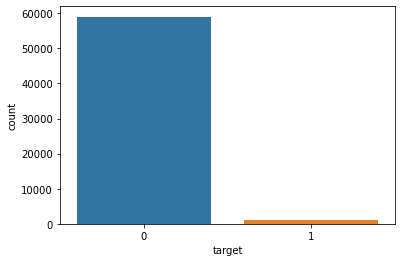

Percentage of Target data points equal to 0 are:  98.33333333333333 %
Percentage of Target data points equal to 1 are:  1.6666666666666667 %


In [11]:
#https://seaborn.pydata.org/generated/seaborn.countplot.html
sns.countplot(x =EquipFail_train_dataset["target"], data = EquipFail_train_dataset)
plt.show()

print ("Percentage of Target data points equal to 0 are: ",(EquipFail_train_dataset_valuecounts[0]/EquipFail_train_dataset.shape[0])*100,"%")
print ("Percentage of Target data points equal to 1 are: ",(EquipFail_train_dataset_valuecounts[1]/EquipFail_train_dataset.shape[0])*100,"%")

<b>Observation: </b> 

1) As per above analysis, there are 98% of failures which are recorded against Surface related failures and 1.6% of failures are belongs to Downhole related failures.

2) We can understand that, Data is imbalanced. We will apply following methods to support imbalanced dataset.

    1)	Upsampling or Downsampling
    2)	Drop Class Priors
    3)	Modify the model to account class imbalance


## 3.1.1 Univariate Analysis Through Line Plot

In [12]:
#replace 'na' strings to NaN
EquipFail_train_dataset=EquipFail_train_dataset.replace('na',np.NaN)

In [13]:
#convert columns of object datatype to float datatype to perform EDA analysis
for columnname in EquipFail_train_dataset:
    #print (i)
    EquipFail_train_dataset[columnname]=EquipFail_train_dataset[columnname].astype(float)

In [14]:
EquipFail_train_dataset.head()

,id,target,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,1.0,0.0,76698.0,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,2.0,0.0,33058.0,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,3.0,0.0,41040.0,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,4.0,0.0,12.0,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,5.0,0.0,60874.0,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0


In [15]:
### find out the count of NaN information in all sensors and will remove feature if the count of NaN is more than 75% as these features are not useful to our ML model as most of the data is NaN's###

NaN_Values_count =[]

NaN_Values_count = [[featuress,EquipFail_train_dataset.shape[0],EquipFail_train_dataset[featuress].isna().sum(),(EquipFail_train_dataset[featuress].isna().sum()/EquipFail_train_dataset.shape[0])*100] for featuress in EquipFail_train_dataset]
NaN_Values_count

#lets convert list to datafram for easy understanding
#https://datatofish.com/list-to-dataframe/

NaN_Values_count_df = DataFrame (NaN_Values_count,columns=['Column_Name','Number of Records (All)','Number of records (NaN)','Percentage of NaN'])


NaN_Values_count_df.sort_values(by=['Percentage of NaN'], inplace=True,ascending=False)
NaN_Values_count_df.head(16)

,Column_Name,Number of Records (All),Number of records (NaN),Percentage of NaN
80,sensor43_measure,60000,49264,82.106667
79,sensor42_measure,60000,48722,81.203333
78,sensor41_measure,60000,47740,79.566667
77,sensor40_measure,60000,46333,77.221667
114,sensor68_measure,60000,46329,77.215000
3,sensor2_measure,60000,46329,77.215000
76,sensor39_measure,60000,44009,73.348333
75,sensor38_measure,60000,39549,65.915000
74,sensor37_measure,60000,27277,45.461667
73,sensor36_measure,60000,23034,38.390000


<b> Observation </b>

- sensor43_measure, sensor42_measure, sensor41_measure, sensor40_measure, sensor68_measure, sensor2_measure	, sensor39_measure, sensor38_measure contains more number of NaN values compared with other sensor features

In [16]:
#Lets drop histogram sensors

#for histcolumnname in EquipFail_train_dataset:
#    #print (i)
#    if "histogram" in histcolumnname:
#        EquipFail_train_dataset.drop([histcolumnname], axis=1, inplace=True)

In [17]:
EquipFail_train_dataset.head()

,id,target,sensor1_measure,sensor2_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,1.0,0.0,76698.0,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,2.0,0.0,33058.0,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,3.0,0.0,41040.0,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,4.0,0.0,12.0,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,5.0,0.0,60874.0,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0


In [18]:
#Lets remove column id
EquipFail_train_dataset.drop(['id'], axis=1, inplace=True)


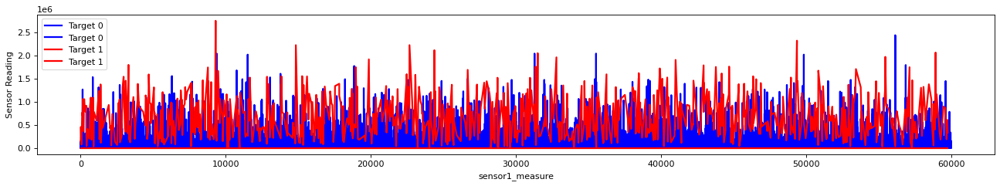

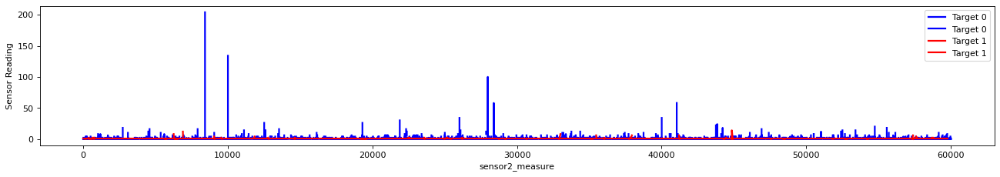

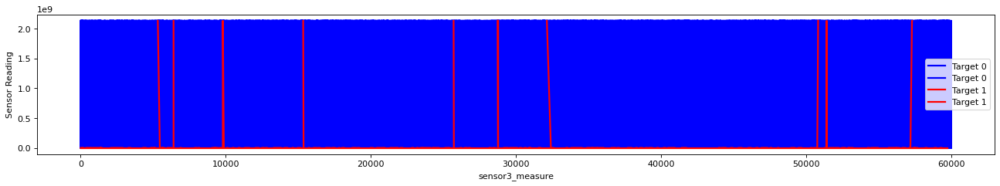

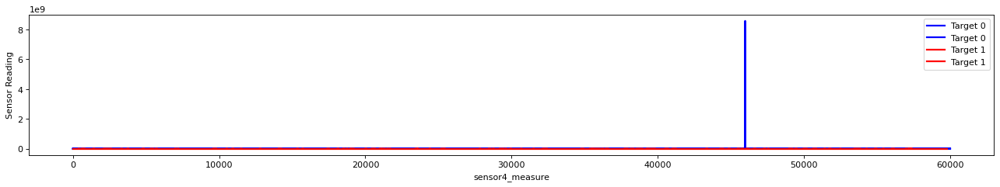

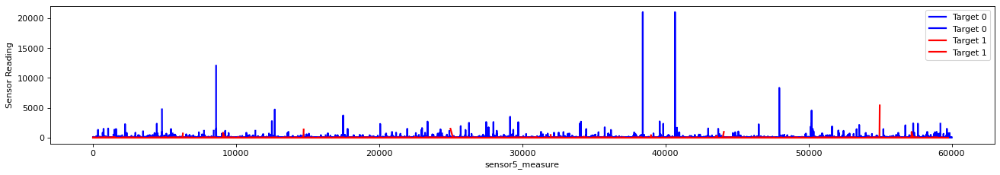

...

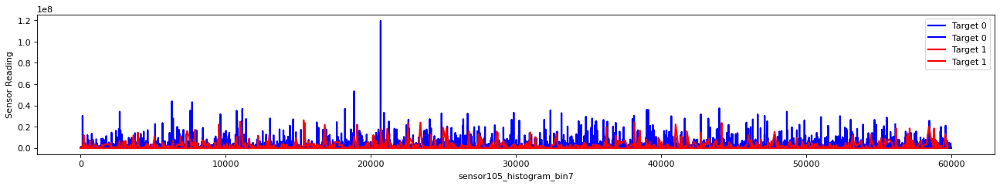

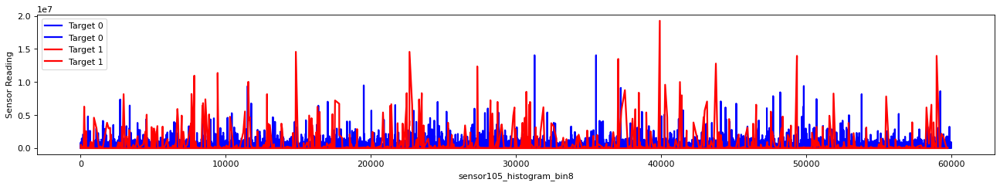

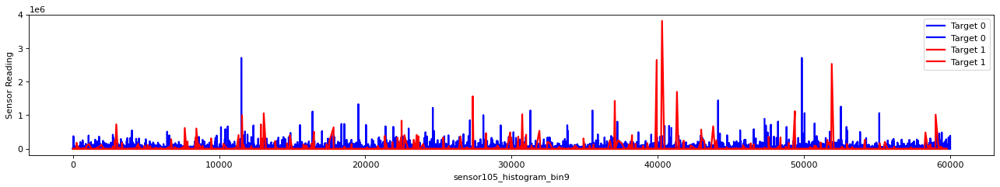

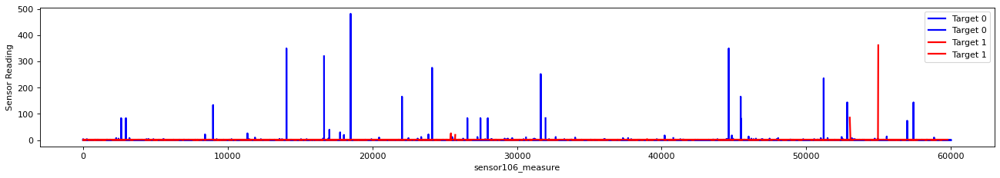

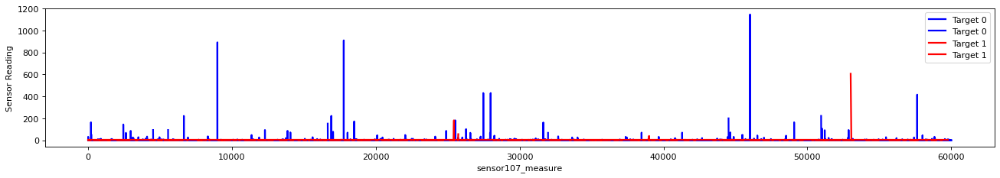

In [28]:

for top15columns_plot in EquipFail_train_dataset.columns[1:]:
    target_0_1=EquipFail_train_dataset[["target",top15columns_plot]]
    target_0=target_0_1[target_0_1["target"]==0]
    target_1=target_0_1[target_0_1["target"]==1]
    plt.figure(num=None, figsize=(20, 3), dpi=80, facecolor='w', edgecolor='k')
    plt.plot(target_0, color='blue', linewidth = 2,  label = 'Target 0')
    plt.plot(target_1, color='red', linewidth = 2,  label = 'Target 1')
    plt.xlabel(top15columns_plot)
    plt.ylabel('Sensor Reading')
    plt.legend()
    plt.show()

<b> Observation </b>

Below are few observations:

- Sensor92_measure contains very less trends for Target 0 (Surface failure) and 1 (downhole failure). Noticed that, most of the sensor92_measure values are either zero or null values.

- Sensor102_measure contains high peaks for surface (Target 0) failures.

- Most of the sensor 3 data points are very high for Target 0 and 1. There is a high chance that, if Sensor 3 reaches to high value then Equipment might fail. Noticed that, there are very less spikes for Target 0 when compared with Target 1

- Sensor 36, 37 and 38 has similar distribution. Target 0 (Surface failure) data points has wide spread

- Sensor 54 graph distribution is looks odd. Lets see more information on sensor 54 later



## 3.1.2 Univariate Analysis Through PDF

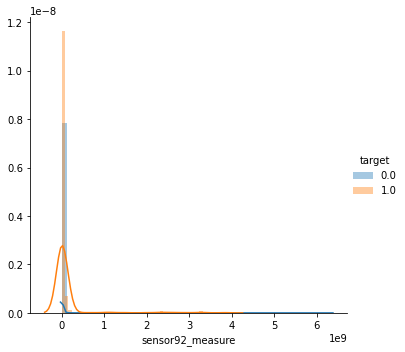

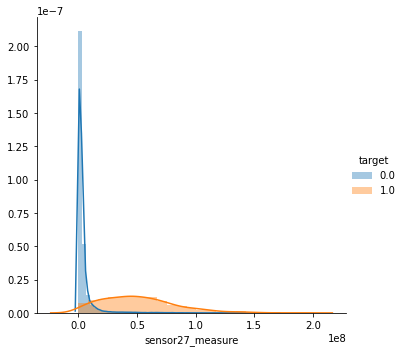

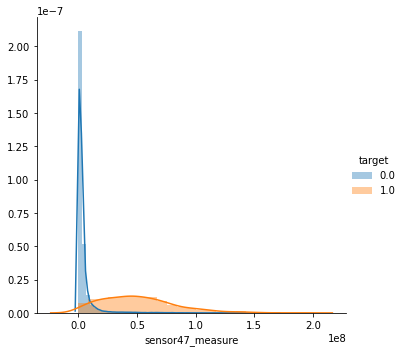

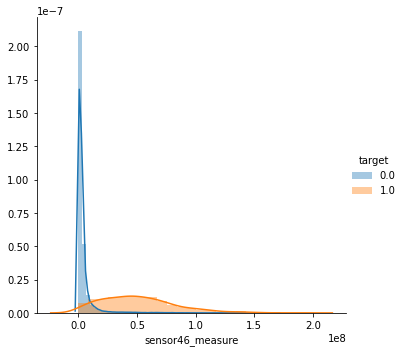

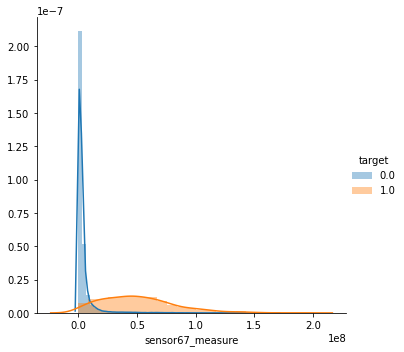

...

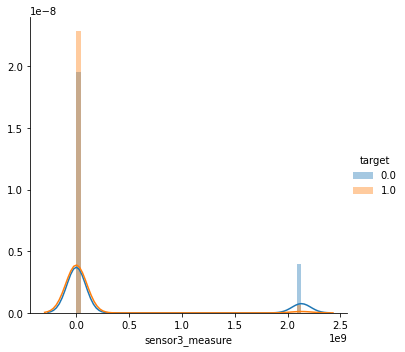

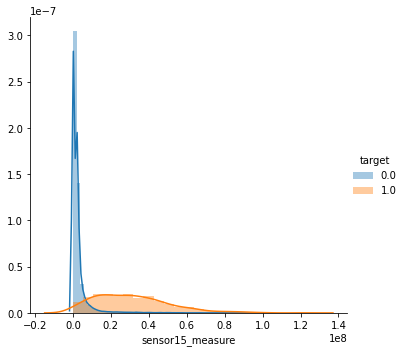

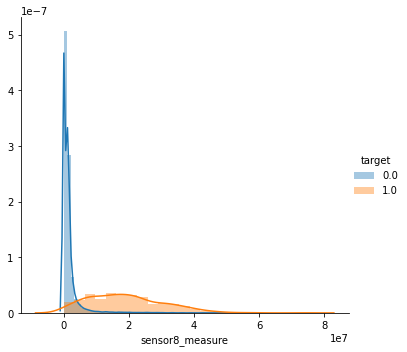

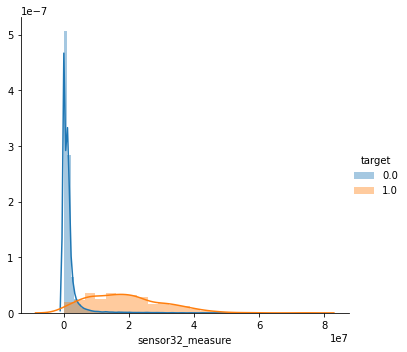

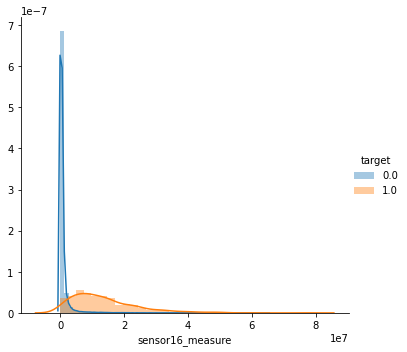

In [34]:
#Lets plot PDF against each column towards target variable to understand the data
columns=["sensor92_measure","sensor27_measure","sensor47_measure","sensor46_measure","sensor67_measure","sensor48_measure","sensor53_measure","sensor59_measure","sensor3_measure","sensor15_measure","sensor8_measure","sensor32_measure","sensor16_measure"]
for top15columns in columns:
    sns.FacetGrid(EquipFail_train_dataset, hue="target", height=5).map(sns.distplot,top15columns).add_legend()
    plt.show()


<b> Observation </b>:

Below are some of the observations:

- sensor92_measure plot has too much of overlapping between target variable 0 and 1. PDF shows that, senssor92_measure has a right skweness (outliers).


- Below sensors PDF are similar and the data is overlapped for a target variable 0 and 1.

   sensor27_measure, sensor47_measure, sensor46_measure, sensor67_measure, sensor48_measure, sensor53_measure, sensor59_measure 


- Noticed that, there are outliers for sensor3_measure after value 2  in X-axis


- Below sensors PDF are similar and the data is overlapped for a target variable 0 and 1.

    sensor15_measure, sensor8_measure, sensor32_measure, sensor16_measure
    
    
- All sensors features has a skwness problem and contains outliers as well

## 3.1.3 Univariate Analysis Through BOX Plot

sensor92_measure


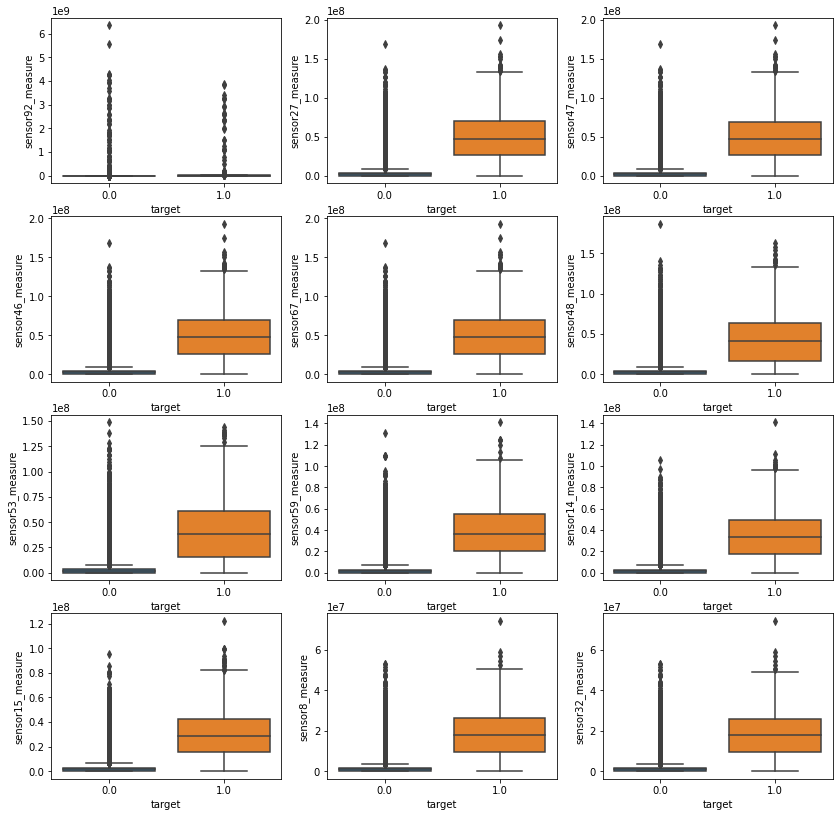

In [27]:
#for top15columns_boxplot in EquipFail_train_dataset.columns[1:]:
#    sns.boxplot(x='target',y=top15columns_boxplot, data=EquipFail_train_dataset)
#    plt.show()
check = ["sensor92_measure","sensor27_measure","sensor47_measure","sensor46_measure","sensor67_measure","sensor48_measure","sensor53_measure","sensor59_measure","sensor14_measure","sensor15_measure","sensor8_measure","sensor32_measure"]
print(check[0])
fig = plt.figure(figsize=(14,14))
#  plot Numerical Data
a = 4  # number of rows
b = 3 # number of columns
c = 1  # initialize plot counter
for top15columns_boxplot in range(0,12):
    plt.subplot(a, b, c)
    sns.boxplot(x='target',y=check[top15columns_boxplot], data=EquipFail_train_dataset)
    c=c+1
plt.show()


<b> Observation </b>:

- sensor92_measure: IQR range for target 0 and 1 is near to zero. It's because most of the values are zero. Target 0 has many outliers when compared with Target 1

- Sensor27_measure, Sensor47_Measure, Sensor46_Measure, Sensor67_Measure, Sensor48_Measure, Sensor53_Measure,, Sensor59_Measure, Sensor14_Measure, Sensor15_Measure, Sensor8_Measure, Sensor32_Measure: 
            1) Observed that, 75 percentile of Surface Failures (Target 0) is less than 25th percentile of Downhole failures (Target 1). Which means, downhole failure trend is higher than surface failures
            2) Median line of a box plot between target 0 and 1 lies outside of the box, which means there is a difference between two target 1 and 0
            3) None of the sensors has a normal distribution but contains a right skewed with outliers


## 3.1.4 Correlation and Co-efficient of Determination

Correlation is one of the useful technique to analyze the data and better way to understand the relationships between variables.

In [19]:
# Lets perform Correlation only on the sensors information by excluding Histogram features

#Lets create a new dataframe and copy sensors information

sensors_data2 = EquipFail_train_dataset[['sensor32_measure','sensor8_measure','sensor27_measure','sensor67_measure','sensor47_measure','sensor46_measure','sensor92_measure','sensor93_measure','sensor14_measure','sensor15_measure','sensor72_measure','sensor78_measure','sensor95_measure','sensor94_measure','sensor12_measure','sensor13_measure','sensor89_measure','sensor33_measure','sensor90_measure','sensor91_measure','sensor97_measure','sensor96_measure','sensor1_measure','sensor45_measure','sensor35_measure','sensor17_measure','sensor34_measure','sensor16_measure','sensor6_measure','sensor5_measure']]
sensors_data2.head()

,sensor32_measure,sensor8_measure,sensor27_measure,sensor67_measure,sensor47_measure,sensor46_measure,sensor92_measure,sensor93_measure,sensor14_measure,sensor15_measure,...,sensor97_measure,sensor96_measure,sensor1_measure,sensor45_measure,sensor35_measure,sensor17_measure,sensor34_measure,sensor16_measure,sensor6_measure,sensor5_measure
0,2551696.0,2551696.0,6700214.0,6700214.0,6700214.0,6700214.0,0.0,0.0,4933296.0,3655166.0,...,1876644.0,14745580.0,76698.0,76698.08,799478.0,1132040.0,947550.0,1766008.0,0.0,0.0
1,1393352.0,1393352.0,3646660.0,3646660.0,3646660.0,3646660.0,0.0,0.0,2560898.0,2127150.0,...,868538.0,4510080.0,33058.0,33057.51,392208.0,338544.0,688314.0,1084598.0,0.0,0.0
2,1234132.0,1234132.0,2673338.0,2673338.0,2673338.0,2673338.0,0.0,0.0,2371990.0,2173634.0,...,48028.0,300240.0,41040.0,41040.08,139730.0,153698.0,160176.0,300796.0,0.0,0.0
3,2668.0,2668.0,21614.0,21614.0,21614.0,21614.0,2014.0,370.0,10184.0,7554.0,...,1822.0,15740.0,12.0,12.69,3090.0,1014.0,7632.0,10764.0,10.0,0.0
4,1974038.0,1974038.0,4289260.0,4289260.0,4289260.0,4289260.0,0.0,0.0,3230626.0,2618878.0,...,80482.0,457040.0,60874.0,60874.03,399410.0,551022.0,653692.0,1058136.0,0.0,0.0


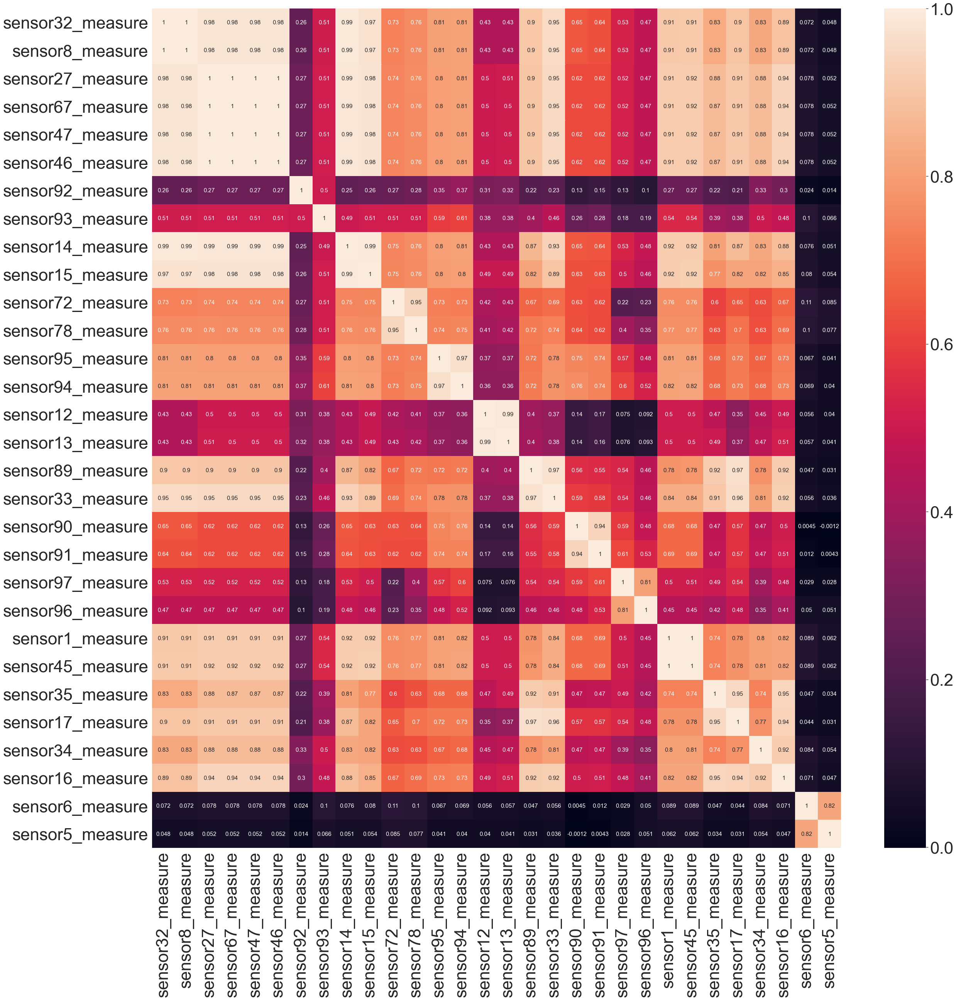

In [21]:
fig, axs = plt.subplots(ncols=1,figsize=(40,40))
sns.set(font_scale=4)

sns.heatmap(sensors_data2.corr(), annot = True,annot_kws={"fontsize":15})

## 3.2 Pre Processing 

In [56]:
#Lets remove the features which contains more than 50% of NaN values
EquipFail_train_dataset.drop(['sensor43_measure','sensor42_measure','sensor41_measure','sensor40_measure',\
                              'sensor68_measure','sensor2_measure','sensor39_measure','sensor38_measure',\
                              'sensor54_measure'], axis=1, inplace=True)


### 3.2.1 Replace Np.Nan with Median values

There are high chances that Mean, Std Varaince and Variance values could be wrong if one outlier found.

Median values will provide correct results even though if data have outliers. 

As we can observe during EDA that, there are multiple outliers are visible across the dataset. Hence, its better to replace 'Np.Nan' with Median to overcome outliers when compared with Mean, std variance etc.,

In [57]:
#Apply for loop to replace Nan with median
for equipfailcolumns in EquipFail_train_dataset.columns[1:]:
    EquipFail_train_dataset[equipfailcolumns].fillna(EquipFail_train_dataset[equipfailcolumns].median(), inplace=True)

In [58]:
X_before_Normalization = EquipFail_train_dataset.copy()

<b> Conclusion on EDA Analysis: </b>


Performed EDA analysis on the sensor features as follows:

1) Performed Univariate analysis on class label (Target) and found out that, the dataset is imbalanced. Due to the data is imbalanced, F1score or AUC score or Confusion matrix is best metrics to check the ML model performance.

2) Analysed the features by applying Line plot. Observed that, 

	- Sensor92_measure contains very less trends for Target 0 (Surface failure) and 1 (downhole failure)
	- Sensor102_measure contains high peaks for surface (Target 0) failures.
	- Most of the sensor 3 data points are very high for Target 0 and 1. There is a high chance that, if Sensor 3 reaches to high value then Equipment might fail. Noticed that, there are very less spikes for Target 0 when compared with Target 1
    - Sensor 36, 37 and 38 has similar distribution. Target 0 (Surface failure) data points has wide spread
    - Sensor 54 graph distribution is looks odd. Lets see more information on sensor 54 later

3) Plotted PDF plot and found that, sensor15_measure, sensor8_measure, sensor32_measure, sensor16_measure has a similar distribution 

4) Plotted Box plot against each feature and observed a few things on following sensors.


- Sensor27_measure, Sensor47_Measure, Sensor46_Measure, Sensor67_Measure, Sensor48_Measure, Sensor53_Measure,, Sensor59_Measure, Sensor14_Measure, Sensor15_Measure, Sensor8_Measure, Sensor32_Measure:

      1) 75 percentile of Surface Failures (Target 0) is less than 25th percentile of Downhole failures (Target 1). Which means, downhole failure trend is higher than surface failures
      2) Median line of a box plot between target 0 and 1 lies outside of the box, which means there is a difference between two target 1 and 0
      3) None of the sensors has a normal distribution but contains a right skewed with outliers

5) Performed Preprocessing on Dataset
    - Dropped unused columns which contains more than 70% of data has NaN values
    - Imputed NaN values with median 


# 4. Apply ML Models

Below are the choosen ML models for the given highly imbalanced dataset

    1) Logistic Regression

    2) Random Forest Classifier
    
    3) LightGBM Classifier

    3) XGBoost Classifier

Have tried other ML models, but above ML models are performing better than others.

# 4.1 Approach 1

Lets apply the following functinoalities in the dataset and will proceed with applying ML models to predict the performance metric

        - Remove unused features (>70% of data contains null values)
        - Impute median for the missing values
        - Apply Normlization on the dataset
        - Apply ML Models
        
This approach will be considered as a base model and will help to provide the least performance metric scores. Following by, will apply more techniques (like feature enigerring, reduce outliers etc.,) to improve the metrics better than Approach 1 metric scores.



Since we have already done the preprocessing on the dataset in previous section, lets apply ML Models to it.

<h2>Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [21]:
y = X_before_Normalization['target'].values
X_before_Normalization.drop(['target'], axis=1, inplace=True)
X = X_before_Normalization
X.head(1)

,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,76698.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,37250.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0


In [22]:
# train test split
from sklearn.model_selection import train_test_split
#splitting data in to train and test with 20 percentage as test data
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, stratify=y,random_state=0)



### Apply Normalization

Normalization is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric columns in the dataset to a common scale, without distorting differences in the ranges of values. 

In [23]:
#normalize dataframe https://stackoverflow.com/questions/26414913/normalize-columns-of-pandas-data-frame

#X_norm = EquipFail_train_dataset.copy() #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler().fit(X_train1)
X_train1 = pd.DataFrame(min_max_scaler.transform(X_train1),columns=X_train1.columns)
X_test1 = pd.DataFrame(min_max_scaler.transform(X_test1),columns=X_test1.columns)
#X_normalized = min_max_scaler.fit_transform(X_norm)
#X_norm_final = pd.DataFrame(min_max_scaler.fit_transform(X_norm),columns=X_norm.columns)
X_train1

,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure
0,0.394478,2.909833e-07,0.000647,0.0,0.0,0.0,0.0,0.000279,0.023449,3.973444e-02,...,0.020601,0.020283,0.018189,0.035423,0.124550,9.200689e-02,0.026573,0.000000,0.0,0.0
1,0.014155,4.421068e-07,0.004619,0.0,0.0,0.0,0.0,0.000000,0.000000,9.640320e-06,...,0.006188,0.005082,0.003168,0.003832,0.004202,7.353230e-04,0.011940,0.018083,0.0,0.0
2,0.000226,9.999998e-01,0.000092,0.0,0.0,0.0,0.0,0.000000,0.000000,4.162905e-05,...,0.000019,0.000027,0.000054,0.000149,0.000242,2.828230e-05,0.000000,0.000000,0.0,0.0
3,0.024482,9.999998e-01,0.003438,0.0,0.0,0.0,0.0,0.000000,0.000000,1.108244e-05,...,0.003486,0.004242,0.003216,0.004414,0.009180,1.007270e-02,0.015532,0.001336,0.0,0.0
4,0.016437,1.013748e-07,0.000965,0.0,0.0,0.0,0.0,0.000000,0.000000,1.445087e-04,...,0.003257,0.003100,0.002278,0.003250,0.005611,1.255309e-03,0.032681,0.027695,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47995,0.000711,7.133783e-08,0.000647,0.0,0.0,0.0,0.0,0.000000,0.000000,3.938285e-05,...,0.000088,0.000121,0.000146,0.001136,0.000023,2.341527e-07,0.000001,0.000000,0.0,0.0
47996,0.013839,3.510572e-07,0.003212,0.0,0.0,0.0,0.0,0.000000,0.000000,5.506257e-07,...,0.004864,0.005269,0.004567,0.006797,0.007879,6.896799e-04,0.000569,0.000000,0.0,0.0
47997,0.000307,1.220252e-08,0.000133,0.0,0.0,0.0,0.0,0.000032,0.000630,8.942861e-05,...,0.000013,0.000011,0.000027,0.000060,0.000145,1.901821e-04,0.000000,0.000000,0.0,0.0
47998,0.170086,7.133783e-08,0.000647,0.0,0.0,0.0,0.0,0.010339,0.054142,4.180504e-02,...,0.026439,0.026320,0.020561,0.035495,0.153336,7.087896e-02,0.000863,0.000000,0.0,0.0


### Define KFold CV

In [24]:
from sklearn.model_selection import KFold
cv=KFold(n_splits=5,random_state=None, shuffle=False)

### find best threshold and plot confusion matrix

In [25]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)



## 4.1.1 Logistic Regression

In [26]:
# Copy splitted data
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [27]:
#Lets take hyper parameter between 10**-4 to 10**4.
#Have used Class_weight parameter to take care of imbalance dataset

from sklearn.linear_model import LogisticRegression
parametersK_LR = {'C' : [(10**x) for x in range(-4,4)] }
LogRegression = GridSearchCV(LogisticRegression(class_weight='balanced'),parametersK_LR,cv=cv,n_jobs=-1,verbose=10)
LogRegression.fit(X_train,y_train)
LogRegression.cv_results_

Fitting 5 folds for each of 8 candidates, totalling 40 fits


{'mean_fit_time': array([0.46797147, 0.54627533, 0.83533592, 1.35096889, 3.18867364,
        3.5429729 , 3.07030773, 2.52654486]),
 'std_fit_time': array([0.06615615, 0.06606958, 0.10481043, 0.19969954, 0.3294432 ,
        0.43249576, 0.18053304, 0.20702107]),
 'mean_score_time': array([0.01328449, 0.01836286, 0.01698995, 0.03437371, 0.0150373 ,
        0.01444511, 0.0125278 , 0.01093082]),
 'std_score_time': array([0.00115966, 0.01039464, 0.00811805, 0.01864344, 0.00228023,
        0.0021712 , 0.00184993, 0.00189355]),
 'param_C': masked_array(data=[0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000],
              mask=[False, False, False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 0.0001},
  {'C': 0.001},
  {'C': 0.01},
  {'C': 0.1},
  {'C': 1},
  {'C': 10},
  {'C': 100},
  {'C': 1000}],
 'split0_test_score': array([0.97302083, 0.96875   , 0.96458333, 0.96572917, 0.97083333,
        0.97614583, 0.9765625 , 0.97645833]),
 'split

In [28]:
BestLogRegParam = LogRegression.best_params_
BestLogRegParam

{'C': 0.0001}

In [29]:
BestLogRegParam = BestLogRegParam.get('C')

<b> Observation </b>

- 0.0001 is the Best hyperparamter provided by GridsearchCV. Let apply the ML model with best hyper paramter to find out the metrics.

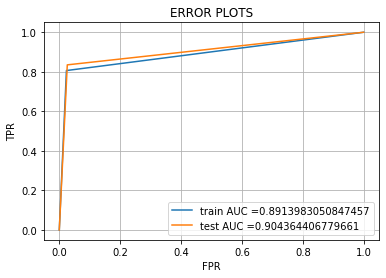

In [30]:
#Apply Logistic regression with best hyper parameter to predict the metrics

LogRegressionClass = LogisticRegression(C=BestLogRegParam, class_weight='balanced' , n_jobs=-1)
LogRegressionClass.fit(X_train, y_train)

y_train_LogReg_pred = LogRegressionClass.predict(X_train)
y_test_LogReg_pred = LogRegressionClass.predict(X_test)

train_LogReg_fpr, train_LogReg_tpr, train_LogReg_thresholds = roc_curve(y_train, y_train_LogReg_pred)
test_LogReg_fpr, test_LogReg_tpr, test_LogReg_thresholds = roc_curve(y_test, y_test_LogReg_pred)
#plot AUC
plt.plot(train_LogReg_fpr, train_LogReg_tpr, label="train AUC ="+str(auc(train_LogReg_fpr, train_LogReg_tpr)))
plt.plot(test_LogReg_fpr, test_LogReg_tpr, label="test AUC ="+str(auc(test_LogReg_fpr, test_LogReg_tpr)))
AUC_LogReg_Train = str(auc(train_LogReg_fpr, train_LogReg_tpr))
AUC_LogReg_Test = str(auc(test_LogReg_fpr, test_LogReg_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


## Observations:
<p>Train Accuray with Hyper Parameter 0.0001 is 89 %</p>
<p>Test Accuray with Hyper Parameter 0.0001 is 90 %</p>

the maximum value of tpr*(1-fpr) 0.7873407044491526 for threshold 1.0


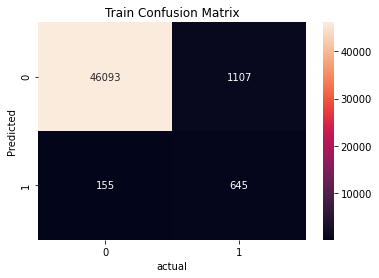

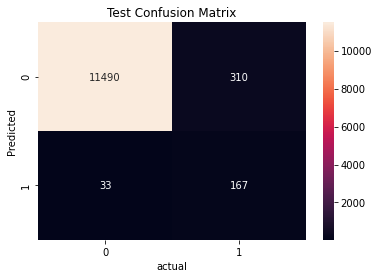

In [31]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
best_LogReg_t = find_best_threshold(train_LogReg_thresholds, train_LogReg_fpr, train_LogReg_tpr)
LogReg_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_LogReg_pred, best_LogReg_t))
df_cm1=pd.DataFrame(LogReg_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
LogReg_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_LogReg_pred, best_LogReg_t))
df_cm1=pd.DataFrame(LogReg_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")


plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> Logistic Regression model with hyper parameter 0.0001 is not a sensible model as TPR rates are very low when compared with FNR for Train and Test confusion matrix. Which means, Logistic regression model is wrongly predicting positive (Target 1) class as Negative (Target 0) class</p>


In [32]:
from sklearn.metrics import f1_score
F1_Score_LogReg_Train=f1_score(y_train,y_train_LogReg_pred)
F1_Score_LogReg_Test=f1_score(y_test,y_test_LogReg_pred)
print('Train f1 score',f1_score(y_train,y_train_LogReg_pred))
print('Test f1 score',f1_score(y_test,y_test_LogReg_pred))

Train f1 score 0.5054858934169278
Test f1 score 0.4933530280649926


## Observations:
<p> Logistic Regression F1 Scores are pretty bad </p>


## 4.1.2 Random Forest

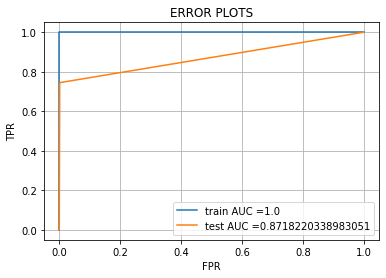

In [33]:
from sklearn.ensemble import RandomForestClassifier

RFClass_Final = RandomForestClassifier(n_estimators=1000,n_jobs=-1,random_state=0)
RFClass_Final.fit(X_train, y_train)

y_train_RFClass_pred = RFClass_Final.predict(X_train)
y_test_RFClass_pred = RFClass_Final.predict(X_test)

train_RFClass_fpr, train_RFClass_tpr, train_RFClass_thresholds = roc_curve(y_train, y_train_RFClass_pred)
test_RFClass_fpr, test_RFClass_tpr, test_RFClass_thresholds = roc_curve(y_test, y_test_RFClass_pred)

plt.plot(train_RFClass_fpr, train_RFClass_tpr, label="train AUC ="+str(auc(train_RFClass_fpr, train_RFClass_tpr)))
plt.plot(test_RFClass_fpr, test_RFClass_tpr, label="test AUC ="+str(auc(test_RFClass_fpr, test_RFClass_tpr)))
AUC_RFClass_Train = str(auc(train_RFClass_fpr, train_RFClass_tpr))
AUC_RFClass_Test = str(auc(test_RFClass_fpr, test_RFClass_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


## Observations:
<p>Train Accuray with Hyper Parameter ('n_estimators': 1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter ('n_estimators': 10000) is 87 %</p>

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


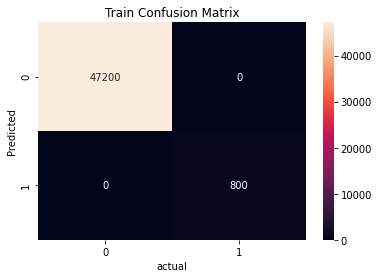

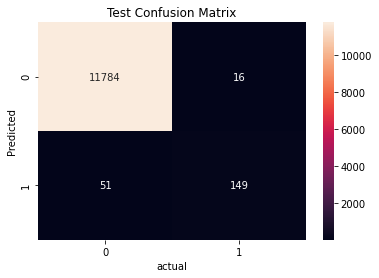

In [34]:
best_RFClass_t = find_best_threshold(train_RFClass_thresholds, train_RFClass_fpr, train_RFClass_tpr)
RFClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
RFClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


## Observations:
<p> Random Forest is sensible model as TPR and TNR rates are high when compared with FNR for Train and Test confusion matrix. However there are few points which are wrongly classified </p>


In [35]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_RFClass_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_RFClass_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.90      0.74      0.82       200

    accuracy                           0.99     12000
   macro avg       0.95      0.87      0.91     12000
weighted avg       0.99      0.99      0.99     12000



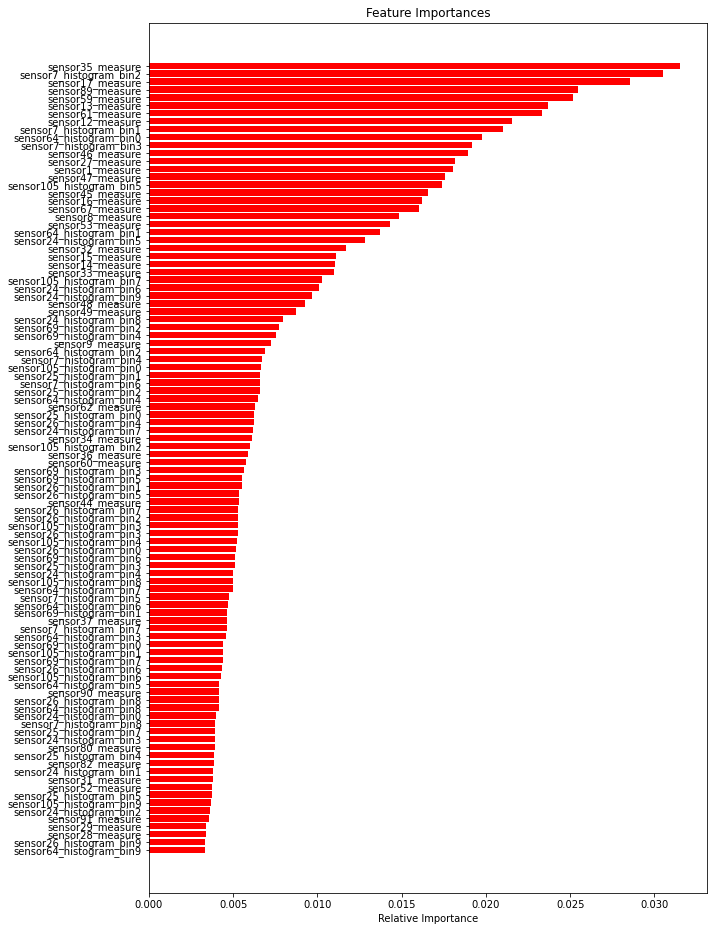

In [36]:
RF_Train_features = X_train.columns
RF_importances = RFClass_Final.feature_importances_
RF_indices = (np.argsort(RF_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(RF_indices)), RF_importances[RF_indices], color='r', align='center')
plt.yticks(range(len(RF_indices)), [RF_Train_features[i] for i in RF_indices])
plt.xlabel('Relative Importance')
plt.show()

### Observations:
<p> Observed that, Sensor 17, 13, 12, 45, 59, 61, 89, 1, 27 and 45 are top 10 most useful and important features </p>


## 4.1.3 LGBM Classifier

#### Apply ML Model with best parameters

In [37]:
#Hyper parameters are tunned manually and below are best hyper parameters
import lightgbm as lgb
clf1 = lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, scale_pos_weight=59, silent=False)
clf1.fit(X_train, y_train)


[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Info] Number of positive: 800, number of negative: 47200
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.074089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37203
[LightGBM] [Info] Number of data points in the train set: 48000, number of used features: 159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, scale_pos_weight=59, silent=False)

#### Plot AUC, Confusion Matrix and F1 Scores

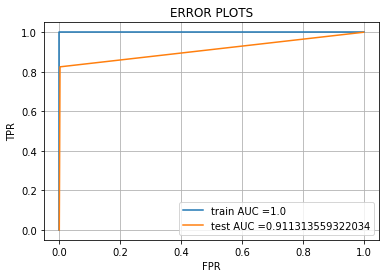

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


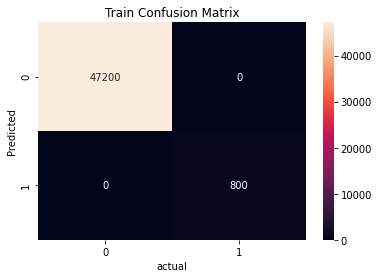

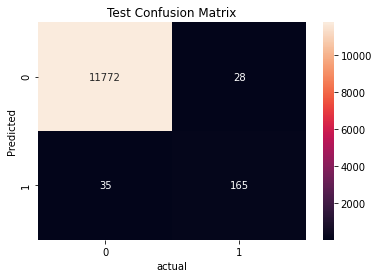

Train f1 score 1.0
Test f1 score 0.8396946564885495


In [38]:
y_train_pred = clf1.predict(X_train)
y_test_pred = clf1.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 91 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

F1 Score improved compared with previous ML models

In [39]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.85      0.82      0.84       200

    accuracy                           0.99     12000
   macro avg       0.93      0.91      0.92     12000
weighted avg       0.99      0.99      0.99     12000



### Feature Importance

In [40]:
# Feature importance

clf1.booster_.feature_importance()

# importance of each attribute
fea_imp_ = pd.DataFrame({'cols':X_train.columns, 'fea_imp':clf1.feature_importances_})
fea_imp_.loc[fea_imp_.fea_imp >=0].sort_values(by=['cols'], ascending = True)

,cols,fea_imp
144,sensor100_measure,3
145,sensor101_measure,1
146,sensor102_measure,459
147,sensor103_measure,349
148,sensor104_measure,340
...,...,...
140,sensor96_measure,400
141,sensor97_measure,268
142,sensor98_measure,529
143,sensor99_measure,497


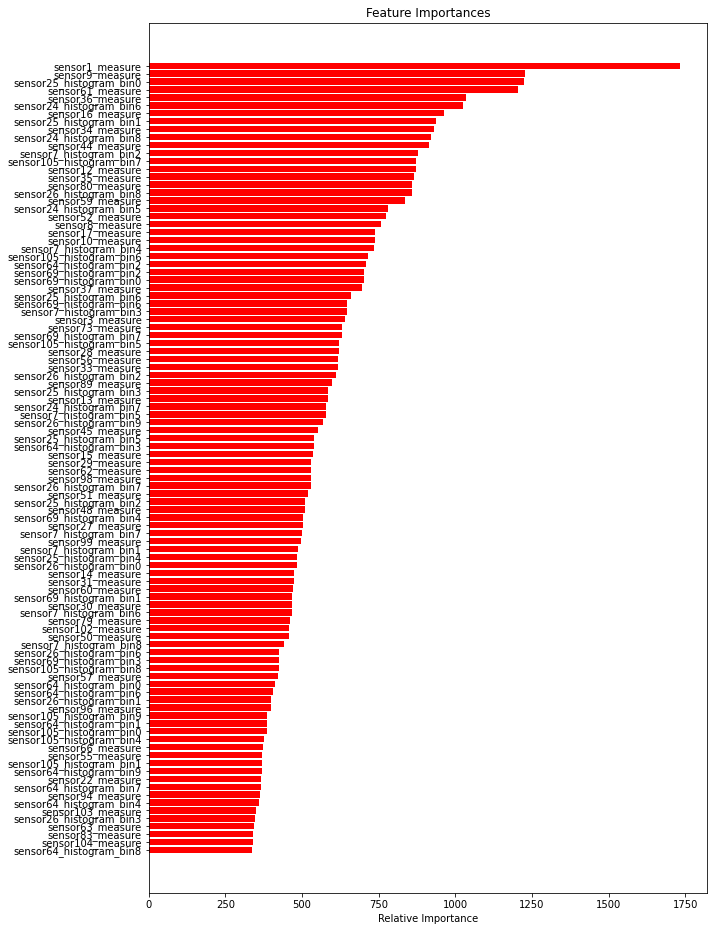

In [41]:
RF_Train_features = X_train.columns
RF_importances = clf1.feature_importances_
RF_indices = (np.argsort(RF_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(RF_indices)), RF_importances[RF_indices], color='r', align='center')
plt.yticks(range(len(RF_indices)), [RF_Train_features[i] for i in RF_indices])
plt.xlabel('Relative Importance')
plt.show()

## 4.1.4 XGBoost

#### Apply ML Model with best parameters

c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:44:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


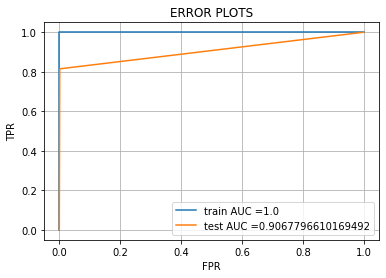

In [42]:
#Hyper parameters are tunned manually and below are best hyper parameters
from xgboost import XGBClassifier
XGBoostClass_Final = XGBClassifier(learning_rate =0.1,n_estimators=1000,max_depth=5,min_child_weight=1,gamma=0,subsample=0.8,colsample_bytree=0.8,objective= 'binary:logistic',nthread=4,scale_pos_weight=1,seed=27)
XGBoostClass_Final.fit(X_train, y_train)

y_train_XGBoostClass_pred = XGBoostClass_Final.predict(X_train)
y_test_XGBoostClass_pred = XGBoostClass_Final.predict(X_test)

train_XGBoostClass_fpr, train_XGBoostClass_tpr, train_XGBoostClass_thresholds = roc_curve(y_train, y_train_XGBoostClass_pred)
test_XGBoostClass_fpr, test_XGBoostClass_tpr, test_XGBoostClass_thresholds = roc_curve(y_test, y_test_XGBoostClass_pred)

plt.plot(train_XGBoostClass_fpr, train_XGBoostClass_tpr, label="train AUC ="+str(auc(train_XGBoostClass_fpr, train_XGBoostClass_tpr)))
plt.plot(test_XGBoostClass_fpr, test_XGBoostClass_tpr, label="test AUC ="+str(auc(test_XGBoostClass_fpr, test_XGBoostClass_tpr)))
AUC_XGBoostClass_Train = str(auc(train_XGBoostClass_fpr, train_XGBoostClass_tpr))
AUC_XGBoostClass_Test = str(auc(test_XGBoostClass_fpr, test_XGBoostClass_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=5, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=5, n_estimators=1000) is 91 %</p>


the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


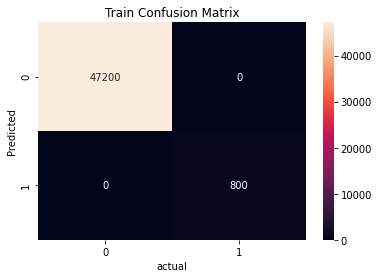

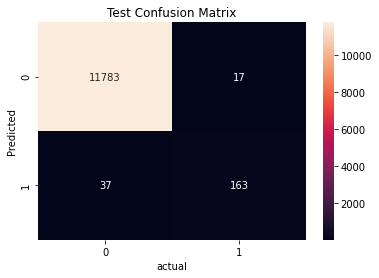

In [43]:
best_XGBoostClass_t = find_best_threshold(train_XGBoostClass_thresholds, train_XGBoostClass_fpr, train_XGBoostClass_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_XGBoostClass_pred, best_XGBoostClass_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_XGBoostClass_pred, best_XGBoostClass_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


<b> Observation </b>

- XGBoostClassifier is a sensible model due to TNR and TPR rates are high when compared with FPR, FNR. However, there are fewer points which are wrongly classfied.


In [44]:
F1_Score_XGBoostClass_Train=f1_score(y_train,y_train_XGBoostClass_pred)
F1_Score_XGBoostClass_Test=f1_score(y_test,y_test_XGBoostClass_pred)
print('Train f1 score',f1_score(y_train,y_train_XGBoostClass_pred))
print('Test f1 score',f1_score(y_test,y_test_XGBoostClass_pred))


Train f1 score 1.0
Test f1 score 0.8578947368421053


In [45]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_XGBoostClass_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_XGBoostClass_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.91      0.81      0.86       200

    accuracy                           1.00     12000
   macro avg       0.95      0.91      0.93     12000
weighted avg       1.00      1.00      1.00     12000



### Feature Importance

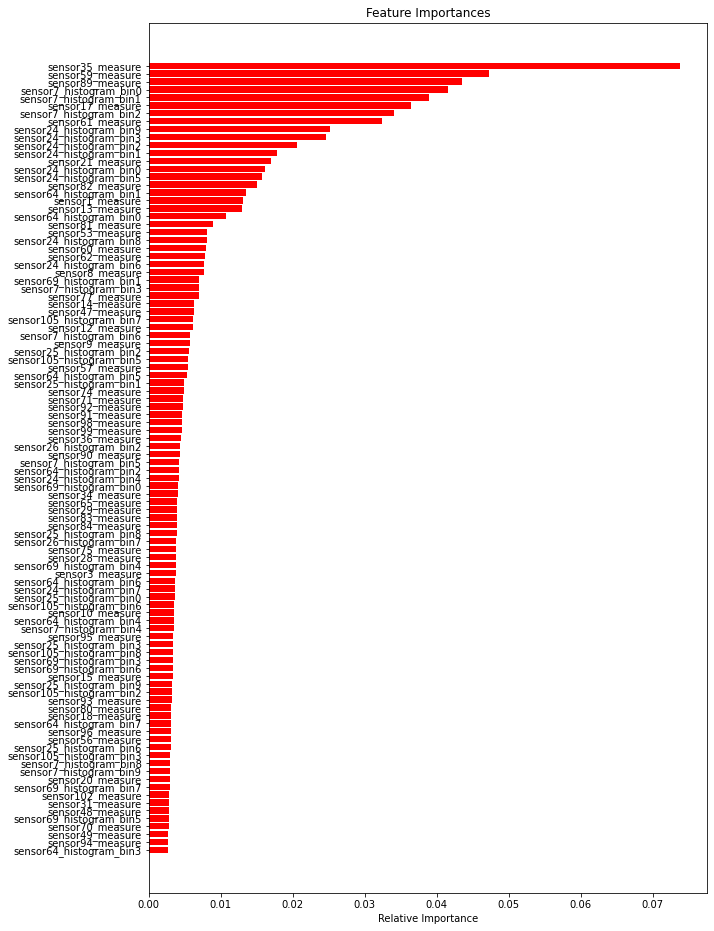

In [46]:
XGBoost_Train_features = X_train.columns
XGBoost_importances = XGBoostClass_Final.feature_importances_
XGBoost_indices = (np.argsort(XGBoost_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(XGBoost_indices)), XGBoost_importances[XGBoost_indices], color='r', align='center')
plt.yticks(range(len(XGBoost_indices)), [XGBoost_Train_features[i] for i in XGBoost_indices])
plt.xlabel('Relative Importance')
plt.show()

## 4.1.5 Approach 1: Conclusion

In [1]:
from prettytable import PrettyTable
import math
    
Finaloutput = PrettyTable()
Finaloutput1 = PrettyTable()

Finaloutput.field_names = ["Model", "Train AUC Score", "Test AUC Score","Train F1 Score", "Test F1 Score", "Test F1 Macro Score"]

Finaloutput.add_row(["Logistic Regression",89,90,51,49,50])
Finaloutput.add_row(["Random Forest",100,87,100,82,91])
Finaloutput.add_row(["LGBMClassifier",100,91,100,84,92])
Finaloutput.add_row(["XGBoost Classifier",100,91,100,86,93])
print(Finaloutput)

+---------------------+-----------------+----------------+----------------+---------------+---------------------+
|        Model        | Train AUC Score | Test AUC Score | Train F1 Score | Test F1 Score | Test F1 Macro Score |
+---------------------+-----------------+----------------+----------------+---------------+---------------------+
| Logistic Regression |        89       |       90       |       51       |       49      |          50         |
|    Random Forest    |       100       |       87       |      100       |       82      |          91         |
|    LGBMClassifier   |       100       |       91       |      100       |       84      |          92         |
|  XGBoost Classifier |       100       |       91       |      100       |       86      |          93         |
+---------------------+-----------------+----------------+----------------+---------------+---------------------+


## Observations:
<p> LGBMClassifier and XGBoostClassifer provided best F1 Macro score when compared with other ML models. However,  XGBoostClassifer has better AUC score and F1 scores when compared with LGBMClassifer. Hence XGBoostClassifer is best ML model  </p>


# 4.2 Approach 2

Lets apply the following functinoalities in the dataset and will proceed with applying ML models to predict the performance metric

        - Remove unused features (>70% of data contains null values)
        - Impute median for the missing values
        - Apply Feature Engineering Techniques
        - Remove one of the Highly Correlated features
        - Apply Normlization on the dataset
        - Apply ML Models
        
Since we have already done the first two funtionalities on the dataset in preprocessing section, lets proceed with remaining functionalities

### Apply Feature Engineering

Adding mean, Median, Std as a new features to the dataset

In [59]:
X_before_Normalization = EquipFail_train_dataset.copy()

In [60]:
#Lets add mean, median to the dataset
X_before_Normalization['mean'] = X_before_Normalization[X_before_Normalization.columns[1:]].mean(axis=1)
X_before_Normalization['median'] = X_before_Normalization[X_before_Normalization.columns[1:]].median(axis=1)


In [61]:
X_before_Normalization.head()

,target,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,...,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9,sensor106_measure,sensor107_measure,mean,median
0,0.0,76698.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0,1.409946e+07,10842.0
1,0.0,33058.0,0.000000e+00,126.0,0.0,0.0,0.0,0.0,0.0,0.0,...,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0,4.215072e+05,6800.0
2,0.0,41040.0,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0,3.170755e+05,1634.0
3,0.0,12.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0,4.592138e+03,38.0
4,0.0,60874.0,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0,6.255118e+05,7535.0


Consider Highly Correlated features and add new features

In [62]:
X_before_Normalization["sensor32_measure'-'sensor8_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor8_measure"]
X_before_Normalization["sensor27_measure'-'sensor67_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor27_measure'-'sensor47_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor27_measure'-'sensor46_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor46_measure"]
X_before_Normalization["sensor92_measure'-'sensor93_measure"]=X_before_Normalization["sensor92_measure"]-X_before_Normalization["sensor93_measure"]
X_before_Normalization["sensor14_measure'-'sensor15_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor72_measure'-'sensor78_measure"]=X_before_Normalization["sensor72_measure"]-X_before_Normalization["sensor78_measure"]
X_before_Normalization["sensor95_measure'-'sensor94_measure"]=X_before_Normalization["sensor95_measure"]-X_before_Normalization["sensor94_measure"]
X_before_Normalization["sensor12_measure'-'sensor13_measure"]=X_before_Normalization["sensor12_measure"]-X_before_Normalization["sensor13_measure"]
X_before_Normalization["sensor89_measure'-'sensor33_measure"]=X_before_Normalization["sensor89_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor90_measure'-'sensor91_measure"]=X_before_Normalization["sensor90_measure"]-X_before_Normalization["sensor91_measure"]
X_before_Normalization["sensor27_measure'-'sensor14_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor14_measure"]
X_before_Normalization["sensor14_measure'-'sensor46_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor46_measure"]
X_before_Normalization["sensor14_measure'-'sensor67_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor14_measure'-'sensor47_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor32_measure'-'sensor14_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor14_measure"]
X_before_Normalization["sensor8_measure'-'sensor14_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor14_measure"]
X_before_Normalization["sensor97_measure'-'sensor96_measure"]=X_before_Normalization["sensor97_measure"]-X_before_Normalization["sensor96_measure"]
X_before_Normalization["sensor32_measure'-'sensor33_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor33_measure'-'sensor8_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor8_measure"]
X_before_Normalization["sensor1_measure'-'sensor45_measure"]=X_before_Normalization["sensor1_measure"]-X_before_Normalization["sensor45_measure"]
X_before_Normalization["sensor89_measure'-'sensor35_measure"]=X_before_Normalization["sensor89_measure"]-X_before_Normalization["sensor35_measure"]
X_before_Normalization["sensor14_measure'-'sensor33_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor33_measure'-'sensor27_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor8_measure'-'sensor27_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor33_measure'-'sensor17_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor17_measure"]
X_before_Normalization["sensor15_measure'-'sensor27_measure"]=X_before_Normalization["sensor15_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor32_measure'-'sensor27_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor67_measure'-'sensor33_measure"]=X_before_Normalization["sensor67_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor33_measure'-'sensor47_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor46_measure'-'sensor33_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor8_measure'-'sensor46_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor46_measure"]
X_before_Normalization["sensor8_measure'-'sensor67_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor8_measure'-'sensor47_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor46_measure'-'sensor15_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor15_measure'-'sensor67_measure"]=X_before_Normalization["sensor15_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor47_measure'-'sensor15_measure"]=X_before_Normalization["sensor47_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor46_measure'-'sensor89_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor67_measure'-'sensor89_measure"]=X_before_Normalization["sensor67_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor47_measure'-'sensor89_measure"]=X_before_Normalization["sensor47_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor46_measure'-'sensor32_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor32_measure"]
X_before_Normalization["sensor67_measure'-'sensor32_measure"]=X_before_Normalization["sensor67_measure"]-X_before_Normalization["sensor32_measure"]
X_before_Normalization["sensor47_measure'-'sensor32_measure"]=X_before_Normalization["sensor47_measure"]-X_before_Normalization["sensor32_measure"]
X_before_Normalization["sensor34_measure'-'sensor16_measure"]=X_before_Normalization["sensor34_measure"]-X_before_Normalization["sensor16_measure"]
X_before_Normalization["sensor32_measure'-'sensor15_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor27_measure'-'sensor89_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor8_measure'-'sensor15_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor6_measure'-'sensor5_measure"]=X_before_Normalization["sensor6_measure"]-X_before_Normalization["sensor5_measure"]
X_before_Normalization["sensor35_measure'-'sensor33_measure"]=X_before_Normalization["sensor35_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor35_measure'-'sensor17_measure"]=X_before_Normalization["sensor35_measure"]-X_before_Normalization["sensor17_measure"]


Based on the Approach 1, listed out top 8 least features from all ML MOdels and will remove such features since these features doesn't useful for ML modelling

In [63]:
#remove least features 

X_before_Normalization.drop(['sensor101_measure','sensor106_measure','sensor107_measure',\
                             'sensor11_measure','sensor85_measure','sensor86_measure',\
                             'sensor87_measure','sensor88_measure'], axis=1, inplace=True)



Lets find out highly correlated features each other and will keep one feature and remove another feature to predict the model better.

In [64]:
#https://www.dezyre.com/recipes/drop-out-highly-correlated-features-in-python
# Creating correlation matrix
cor_matrix = X_before_Normalization.corr().abs()
# Selecting upper triangle of correlation matrix
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),
                                  k=1).astype(np.bool))
# Finding index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]

# Droping Marked Features
X_before_Normalization.drop(to_drop, axis=1, inplace=True)


['sensor13_measure', 'sensor14_measure', 'sensor15_measure', 'sensor26_histogram_bin3', 'sensor26_histogram_bin4', 'sensor27_measure', 'sensor32_measure', 'sensor33_measure', 'sensor35_measure', 'sensor45_measure', 'sensor46_measure', 'sensor47_measure', 'sensor53_measure', 'sensor56_measure', 'sensor59_measure', 'sensor64_histogram_bin5', 'sensor65_measure', 'sensor67_measure', 'sensor89_measure', 'sensor95_measure', 'sensor105_histogram_bin4', "sensor27_measure'-'sensor47_measure", "sensor27_measure'-'sensor46_measure", "sensor92_measure'-'sensor93_measure", "sensor95_measure'-'sensor94_measure", "sensor12_measure'-'sensor13_measure", "sensor90_measure'-'sensor91_measure", "sensor27_measure'-'sensor14_measure", "sensor14_measure'-'sensor46_measure", "sensor14_measure'-'sensor67_measure", "sensor14_measure'-'sensor47_measure", "sensor32_measure'-'sensor14_measure", "sensor8_measure'-'sensor14_measure", "sensor97_measure'-'sensor96_measure", "sensor32_measure'-'sensor33_measure", "sen

Above are the highly correlated features. Lets remove such features

In [68]:
X_before_Normalization.head(1
                        )

,target,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,...,median,sensor32_measure'-'sensor8_measure,sensor27_measure'-'sensor67_measure,sensor14_measure'-'sensor15_measure,sensor72_measure'-'sensor78_measure,sensor89_measure'-'sensor33_measure,sensor1_measure'-'sensor45_measure,sensor32_measure'-'sensor15_measure,sensor6_measure'-'sensor5_measure,sensor35_measure'-'sensor17_measure
0,0.0,76698.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10842.0,0.0,0.0,1278130.0,-1207986.0,-35236.0,-0.08,-1103470.0,0.0,-332562.0


In [67]:
# Droping Marked Features

X_before_Normalization.drop(to_drop, axis=1, inplace=True)


<h2> Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [56]:
y = X_before_Normalization['target'].values
X_before_Normalization.drop(['target'], axis=1, inplace=True)
X = X_before_Normalization
X.head(1)

,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,median,sensor32_measure'-'sensor8_measure,sensor27_measure'-'sensor67_measure,sensor14_measure'-'sensor15_measure,sensor72_measure'-'sensor78_measure,sensor89_measure'-'sensor33_measure,sensor1_measure'-'sensor45_measure,sensor32_measure'-'sensor15_measure,sensor6_measure'-'sensor5_measure,sensor35_measure'-'sensor17_measure
0,76698.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,37250.0,...,10842.0,0.0,0.0,1278130.0,-1207986.0,-35236.0,-0.08,-1103470.0,0.0,-332562.0


In [57]:
# train test split
from sklearn.model_selection import train_test_split
#splitting data in to train and test with 20 percentage as test data
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, stratify=y,random_state=0)


### Apply Normalization

In [58]:
#normalize dataframe https://stackoverflow.com/questions/26414913/normalize-columns-of-pandas-data-frame
min_max_scaler = preprocessing.MinMaxScaler().fit(X_train1)
X_train1 = pd.DataFrame(min_max_scaler.transform(X_train1),columns=X_train1.columns)
X_test1 = pd.DataFrame(min_max_scaler.transform(X_test1),columns=X_test1.columns)

,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,median,sensor32_measure'-'sensor8_measure,sensor27_measure'-'sensor67_measure,sensor14_measure'-'sensor15_measure,sensor72_measure'-'sensor78_measure,sensor89_measure'-'sensor33_measure,sensor1_measure'-'sensor45_measure,sensor32_measure'-'sensor15_measure,sensor6_measure'-'sensor5_measure,sensor35_measure'-'sensor17_measure
0,0.394478,2.909833e-07,0.000647,0.0,0.0,0.0,0.0,0.000279,0.023449,3.973444e-02,...,0.164626,0.76532,0.29693,0.436526,0.992770,0.501224,0.029643,0.344773,0.267258,0.296792
1,0.014155,4.421068e-07,0.004619,0.0,0.0,0.0,0.0,0.000000,0.000000,9.640320e-06,...,0.006525,0.76532,0.29693,0.403998,0.973001,0.607827,0.029642,0.572571,0.267258,0.184444
2,0.000226,9.999998e-01,0.000092,0.0,0.0,0.0,0.0,0.000000,0.000000,4.162905e-05,...,0.000280,0.76532,0.29693,0.402227,0.999997,0.613239,0.029643,0.579592,0.267258,0.182781
3,0.024482,9.999998e-01,0.003438,0.0,0.0,0.0,0.0,0.000000,0.000000,1.108244e-05,...,0.002561,0.76532,0.29693,0.407466,0.999910,0.600697,0.029643,0.564471,0.267258,0.183796
4,0.016437,1.013748e-07,0.000965,0.0,0.0,0.0,0.0,0.000000,0.000000,1.445087e-04,...,0.008361,0.76532,0.29693,0.404122,0.998091,0.607473,0.029643,0.569669,0.267258,0.179982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47995,0.000711,7.133783e-08,0.000647,0.0,0.0,0.0,0.0,0.000000,0.000000,3.938285e-05,...,0.000127,0.76532,0.29693,0.402229,0.992770,0.613089,0.029642,0.579474,0.267258,0.182522
47996,0.013839,3.510572e-07,0.003212,0.0,0.0,0.0,0.0,0.000000,0.000000,5.506257e-07,...,0.005075,0.76532,0.29693,0.404035,0.998996,0.607268,0.029642,0.569348,0.267258,0.179936
47997,0.000307,1.220252e-08,0.000133,0.0,0.0,0.0,0.0,0.000032,0.000630,8.942861e-05,...,0.000205,0.76532,0.29693,0.402062,1.000000,0.613374,0.029642,0.579543,0.267258,0.182789
47998,0.170086,7.133783e-08,0.000647,0.0,0.0,0.0,0.0,0.010339,0.054142,4.180504e-02,...,0.329929,0.76532,0.29693,0.407803,0.857454,0.569542,0.029642,0.493638,0.267258,0.193433


In [59]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

## 4.2.1 Random Forest With No Sampling Techique

#### Apply ML Model with best parameters

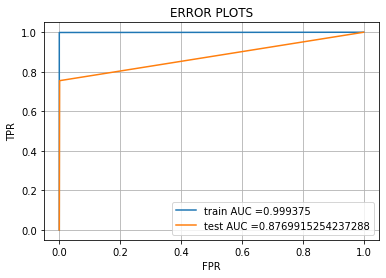

In [60]:
RFClass_Final = RFClass_Final = RandomForestClassifier(max_depth=200,n_estimators=1000,n_jobs=-1,random_state=0)
RFClass_Final.fit(X_train, y_train)

y_train_RFClass_pred = RFClass_Final.predict(X_train)
y_test_RFClass_pred = RFClass_Final.predict(X_test)

train_RFClass_fpr, train_RFClass_tpr, train_RFClass_thresholds = roc_curve(y_train, y_train_RFClass_pred)
test_RFClass_fpr, test_RFClass_tpr, test_RFClass_thresholds = roc_curve(y_test, y_test_RFClass_pred)

plt.plot(train_RFClass_fpr, train_RFClass_tpr, label="train AUC ="+str(auc(train_RFClass_fpr, train_RFClass_tpr)))
plt.plot(test_RFClass_fpr, test_RFClass_tpr, label="test AUC ="+str(auc(test_RFClass_fpr, test_RFClass_tpr)))
AUC_RFClass_Train = str(auc(train_RFClass_fpr, train_RFClass_tpr))
AUC_RFClass_Test = str(auc(test_RFClass_fpr, test_RFClass_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


## Observations:
<p>Train Accuray with Hyper Parameter ({'max_depth': 200, 'n_estimators': 1000}) is 100 %</p>
<p>Test Accuray with Hyper Parameter ({'max_depth': 200, 'n_estimators': 1000}) is 88 %</p>

#### Plot ROC and Confusion Matrix

the maximum value of tpr*(1-fpr) 0.99875 for threshold 1.0


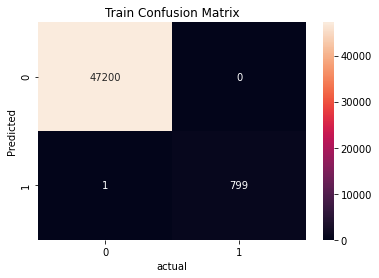

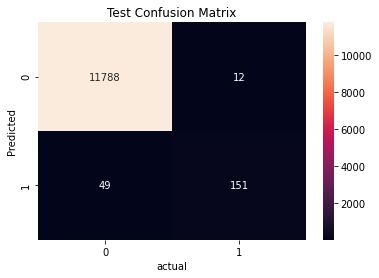

In [61]:
best_RFClass_t = find_best_threshold(train_RFClass_thresholds, train_RFClass_fpr, train_RFClass_tpr)
RFClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
RFClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


## Observations:
<p> Random Forest is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified </p>


In [62]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_RFClass_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_RFClass_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.93      0.76      0.83       200

    accuracy                           0.99     12000
   macro avg       0.96      0.88      0.91     12000
weighted avg       0.99      0.99      0.99     12000



In [63]:
F1_Score_RFClass_Train=f1_score(y_train,y_train_RFClass_pred)
F1_Score_RFClass_Test=f1_score(y_test,y_test_RFClass_pred)
print('Train f1 score',f1_score(y_train,y_train_RFClass_pred))
print('Test f1 score',f1_score(y_test,y_test_RFClass_pred))


Train f1 score 0.9993746091307067
Test f1 score 0.8319559228650139


### Feature Importance

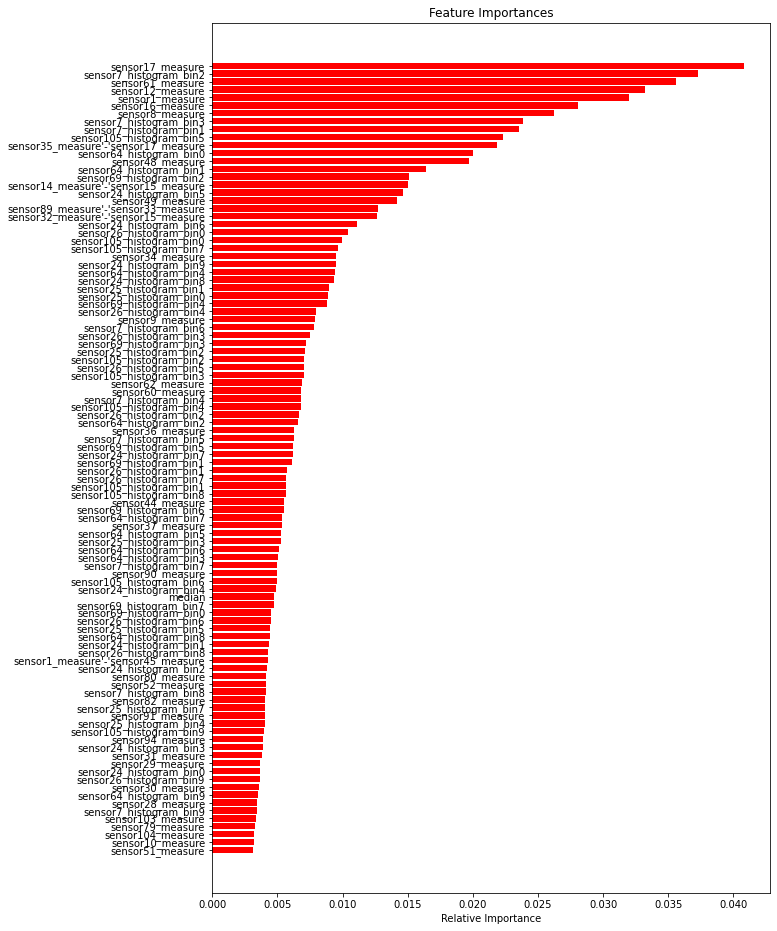

In [64]:
RF_Train_features = X_train.columns
RF_importances = RFClass_Final.feature_importances_
RF_indices = (np.argsort(RF_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(RF_indices)), RF_importances[RF_indices], color='r', align='center')
plt.yticks(range(len(RF_indices)), [RF_Train_features[i] for i in RF_indices])
plt.xlabel('Relative Importance')
plt.show()

## 4.2.2 RandomForest with RandomOverSampler

In [65]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [66]:
#randomoversampler sklearn example https://imbalanced-learn.readthedocs.io/en/stable/over_sampling.html
#Perform Resampling only on Train data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_train).items()))

[(0.0, 47200), (1.0, 47200)]


In [67]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [68]:
from sklearn.ensemble import RandomForestClassifier

RFClass_Final = RandomForestClassifier(n_estimators=1000,n_jobs=-1)
RFClass_Final.fit(X_train, y_train)
y_train_RFClass_pred = RFClass_Final.predict(X_train)
y_test_RFClass_pred = RFClass_Final.predict(X_test)

#### Plot AUC, Confusion Matrix and F1 Scores

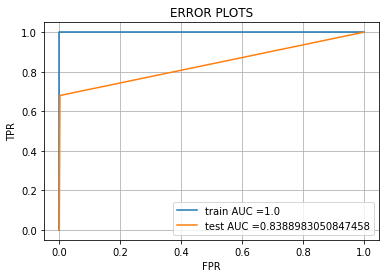

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


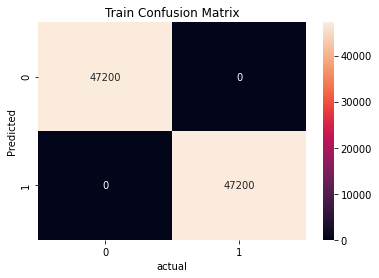

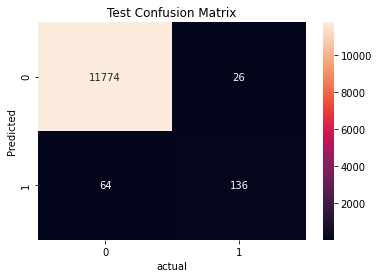

In [69]:
train_RFClass_fpr, train_RFClass_tpr, train_RFClass_thresholds = roc_curve(y_train, y_train_RFClass_pred)
test_RFClass_fpr, test_RFClass_tpr, test_RFClass_thresholds = roc_curve(y_test, y_test_RFClass_pred)

plt.plot(train_RFClass_fpr, train_RFClass_tpr, label="train AUC ="+str(auc(train_RFClass_fpr, train_RFClass_tpr)))
plt.plot(test_RFClass_fpr, test_RFClass_tpr, label="test AUC ="+str(auc(test_RFClass_fpr, test_RFClass_tpr)))
AUC_RFClass_Train = str(auc(train_RFClass_fpr, train_RFClass_tpr))
AUC_RFClass_Test = str(auc(test_RFClass_fpr, test_RFClass_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()
best_RFClass_t = find_best_threshold(train_RFClass_thresholds, train_RFClass_fpr, train_RFClass_tpr)
RFClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
RFClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


### Observations:
<p>Train Accuray with Hyper Parameter (n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (n_estimators=1000) is 84 %</p>

Random Forest is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [70]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_RFClass_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_RFClass_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00     11800
         1.0       0.84      0.68      0.75       200

    accuracy                           0.99     12000
   macro avg       0.92      0.84      0.87     12000
weighted avg       0.99      0.99      0.99     12000



### Feature Importance

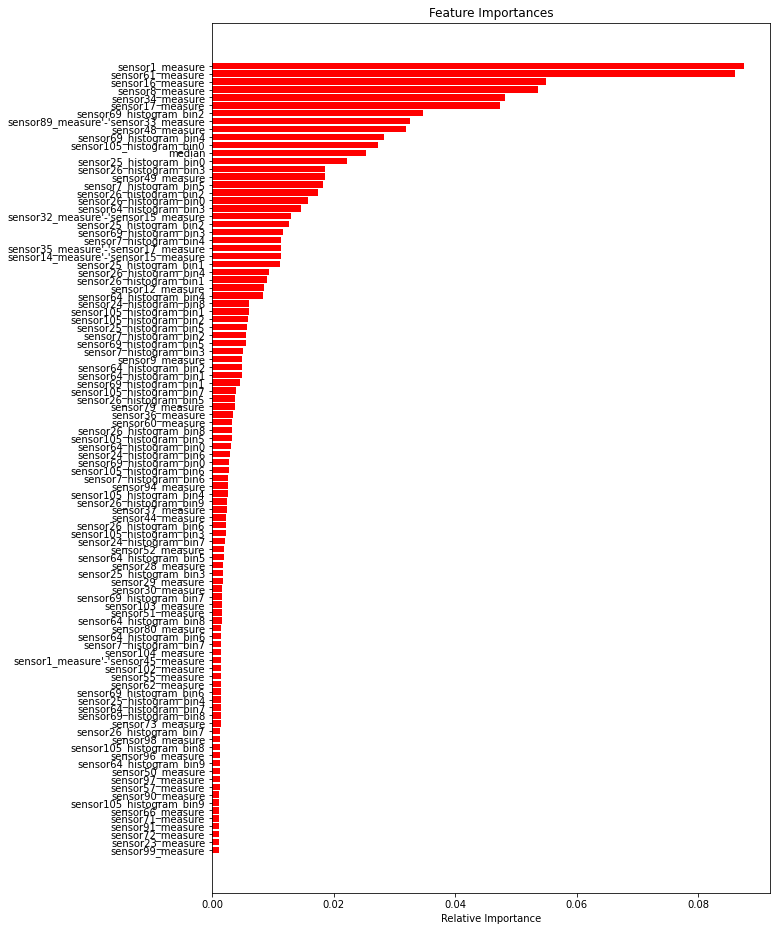

In [71]:
RF_Train_features = X_train.columns
RF_importances = RFClass_Final.feature_importances_
RF_indices = (np.argsort(RF_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(RF_indices)), RF_importances[RF_indices], color='r', align='center')
plt.yticks(range(len(RF_indices)), [RF_Train_features[i] for i in RF_indices])
plt.xlabel('Relative Importance')
plt.show()

## 4.2.3 LIGHT GBM Classifer with No Sampling

#### Apply ML Model with best parameters

In [72]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [73]:
import lightgbm as lgb
clf1=lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, scale_pos_weight=59, silent=False,reg_lambda=0.28)
clf1.fit(X_train, y_train)

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Info] Number of positive: 800, number of negative: 47200
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 35046
[LightGBM] [Info] Number of data points in the train set: 48000, number of used features: 146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, reg_lambda=0.28, scale_pos_weight=59,
               silent=False)

#### Plot AUC, Confusion Matrix and F1 Scores

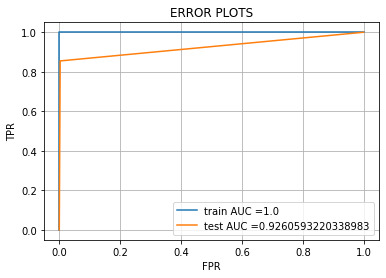

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


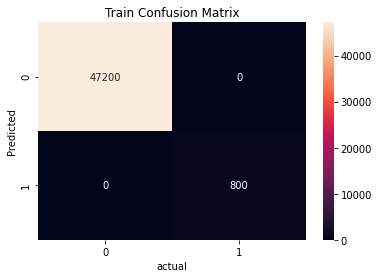

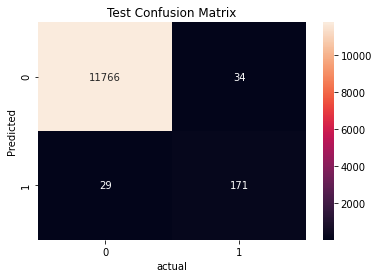

Train f1 score 1.0
Test f1 score 0.8444444444444444


In [74]:
y_train_pred = clf1.predict(X_train)
y_test_pred = clf1.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 93 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

F1 Score improved compared with previous ML models

In [75]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.83      0.85      0.84       200

    accuracy                           0.99     12000
   macro avg       0.92      0.93      0.92     12000
weighted avg       0.99      0.99      0.99     12000



### Feature Importance

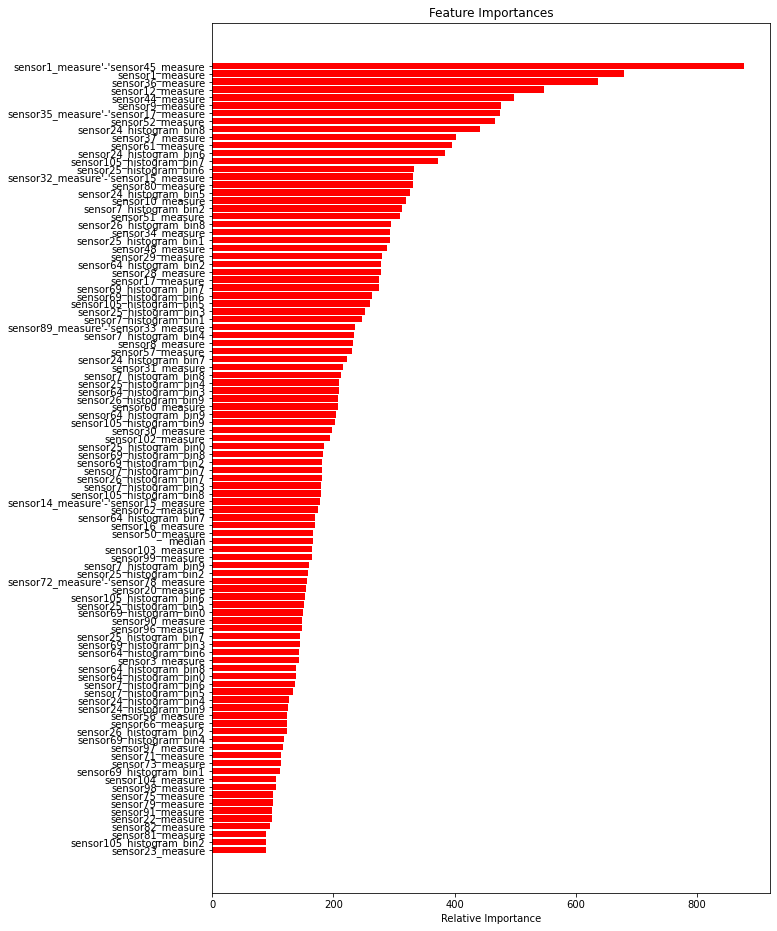

In [76]:
RF_Train_features = X_train.columns
RF_importances = clf1.feature_importances_
RF_indices = (np.argsort(RF_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(RF_indices)), RF_importances[RF_indices], color='r', align='center')
plt.yticks(range(len(RF_indices)), [RF_Train_features[i] for i in RF_indices])
plt.xlabel('Relative Importance')
plt.show()

## 4.2.4 LIGHT GBM Classifer with RandomOverSampler

In [77]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [78]:
#randomoversampler sklearn example https://imbalanced-learn.readthedocs.io/en/stable/over_sampling.html
#Perform Resampling only on Train data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_train).items()))

[(0.0, 47200), (1.0, 47200)]


In [79]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [80]:
import lightgbm as lgb
clf1=lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, scale_pos_weight=59, silent=False,reg_lambda=0.28)
clf1.fit(X_train, y_train)



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Info] Number of positive: 47200, number of negative: 47200
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.136794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34827
[LightGBM] [Info] Number of data points in the train set: 94400, number of used features: 147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, reg_lambda=0.28, scale_pos_weight=59,
               silent=False)

#### Plot AUC, Confusion Matrix and F1 Scores

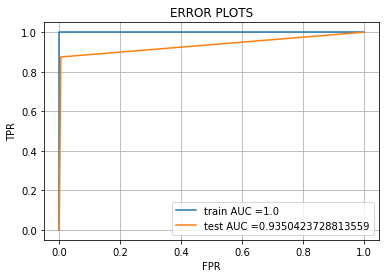

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


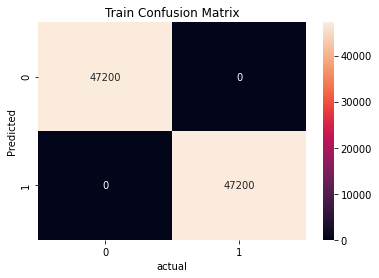

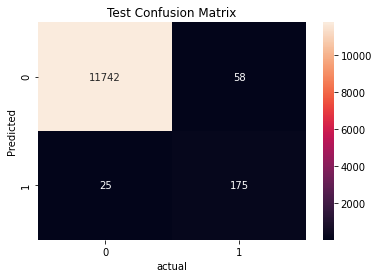

In [81]:
y_train_pred1 = clf1.predict(X_train)
y_test_pred1 = clf1.predict(X_test)



train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred1)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred1)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()




### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 94 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [82]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred1))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred1))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.75      0.88      0.81       200

    accuracy                           0.99     12000
   macro avg       0.87      0.94      0.90     12000
weighted avg       0.99      0.99      0.99     12000



## 4.2.5 LIGHT GBM Classifer with SMOTE

In [83]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [84]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94400, 148)
After OverSampling, the shape of train_y: (94400,) 

After OverSampling, counts of label '1': 47200
After OverSampling, counts of label '0': 47200


In [85]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [86]:
import lightgbm as lgb
clf1 = lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
              n_estimators=200, num_leaves=300, objective='binary',
               random_state=0, reg_lambda=0.28)
clf1.fit(X_train, y_train)

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt


LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
               n_estimators=200, num_leaves=300, objective='binary',
               random_state=0, reg_lambda=0.28)

#### Plot AUC, Confusion Matrix and F1 Scores

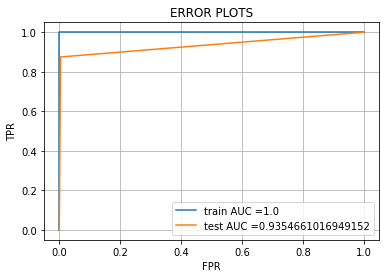

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


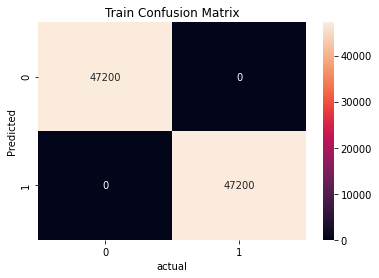

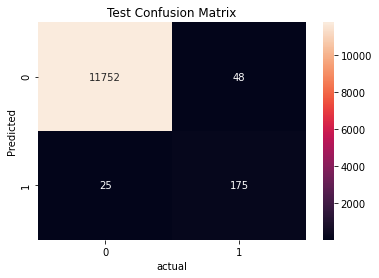

In [87]:
y_train_pred1 = clf1.predict(X_train)
y_test_pred1 = clf1.predict(X_test)


train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred1)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred1)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 94 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified



In [88]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred1))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred1))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.78      0.88      0.83       200

    accuracy                           0.99     12000
   macro avg       0.89      0.94      0.91     12000
weighted avg       0.99      0.99      0.99     12000



## 4.2.6 LIGHT GBM Classifer with SMOTE TOMEK

In [89]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [90]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
sm = SMOTETomek(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94394, 148)
After OverSampling, the shape of train_y: (94394,) 

After OverSampling, counts of label '1': 47197
After OverSampling, counts of label '0': 47197


In [91]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47197
47197


#### Apply ML Model with best parameters

In [92]:
import lightgbm as lgb
clf1 = lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
              n_estimators=200, num_leaves=300, objective='binary',
               random_state=0)
clf1.fit(X_train, y_train)

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt


LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
               n_estimators=200, num_leaves=300, objective='binary',
               random_state=0)

#### Plot AUC, Confusion Matrix and F1 Scores

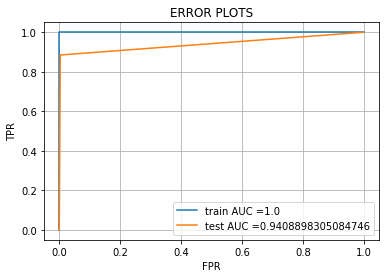

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


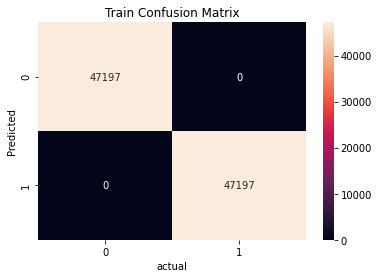

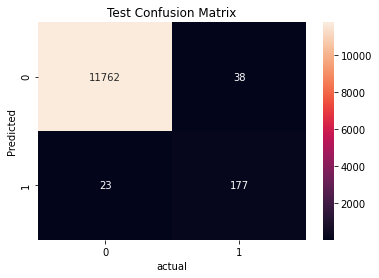

In [93]:
y_train_pred1 = clf1.predict(X_train)
y_test_pred1 = clf1.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred1)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred1)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 94 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

In [94]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred1))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred1))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47197
         1.0       1.00      1.00      1.00     47197

    accuracy                           1.00     94394
   macro avg       1.00      1.00      1.00     94394
weighted avg       1.00      1.00      1.00     94394

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.82      0.89      0.85       200

    accuracy                           0.99     12000
   macro avg       0.91      0.94      0.93     12000
weighted avg       1.00      0.99      1.00     12000



## 4.2.7 XGBOOST With No Sampling

#### Apply ML Model with best parameters

In [95]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [96]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(learning_rate =0.1,n_estimators=1000,max_depth=5,min_child_weight=1,
                                   gamma=0,subsample=0.8,colsample_bytree=0.8,objective= 'binary:logistic',
                                   nthread=4,scale_pos_weight=1,seed=27)
XGClassifier_final.fit(X_train, y_train )

In [97]:
XGClassifier_final.fit(X_train, y_train )
                       #eval_metric=eval_metric, eval_set=eval_set, 
                       #verbose=True)

c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[16:59:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
              random_state=27, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=27, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

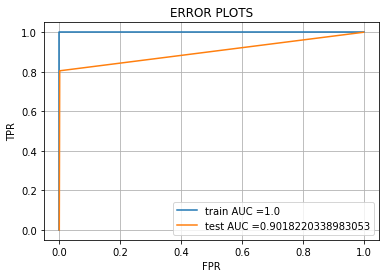

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


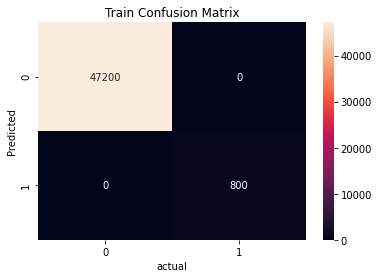

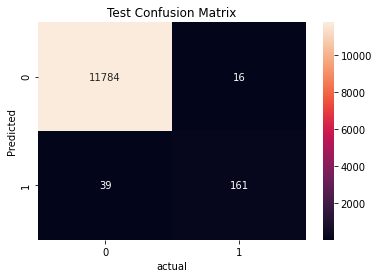

Train f1 score 1.0
Test f1 score 0.8541114058355438


In [98]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=5, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=5, n_estimators=1000) is 90 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

F1 Score improved compared with previous ML models

In [99]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.91      0.81      0.85       200

    accuracy                           1.00     12000
   macro avg       0.95      0.90      0.93     12000
weighted avg       1.00      1.00      1.00     12000



### Feature Importance

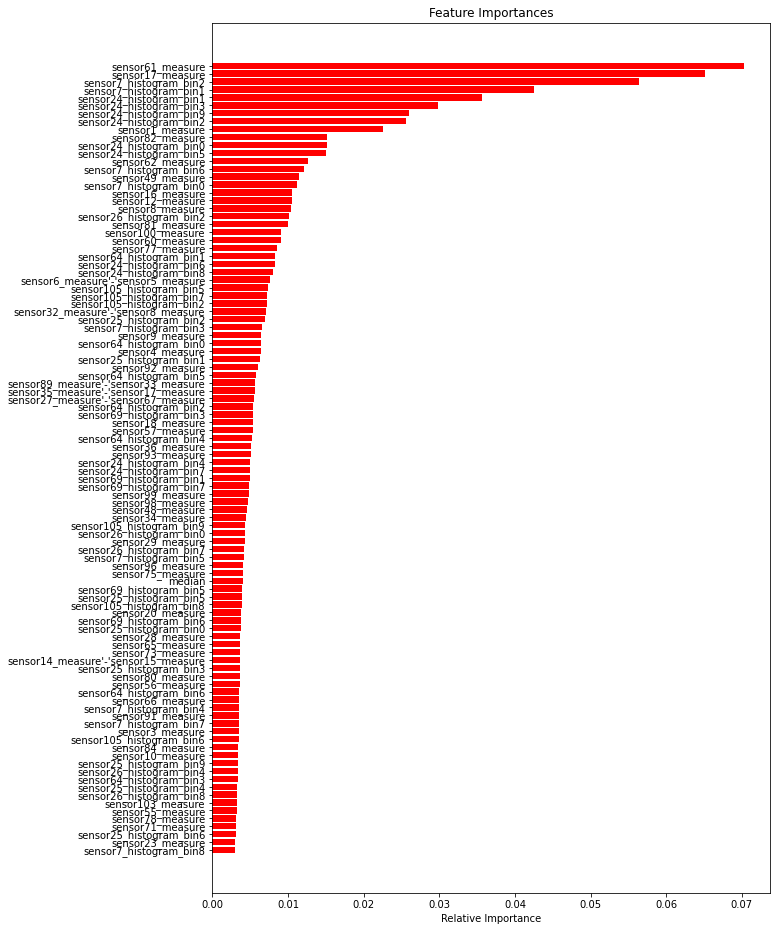

In [100]:
RF_Train_features = X_train.columns
RF_importances = XGClassifier_final.feature_importances_
RF_indices = (np.argsort(RF_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(RF_indices)), RF_importances[RF_indices], color='r', align='center')
plt.yticks(range(len(RF_indices)), [RF_Train_features[i] for i in RF_indices])
plt.xlabel('Relative Importance')
plt.show()

In [101]:
# Feature importance

#lightGBM model fit
#gbm = lgb.LGBMClassifier()
#gbm.fit(train, target)
XGClassifier_final.feature_importances_

# importance of each attribute
fea_imp_ = pd.DataFrame({'cols':X_train.columns, 'fea_imp':XGClassifier_final.feature_importances_})
fea_imp_.loc[fea_imp_.fea_imp <0.004].sort_values(by=['cols'], ascending = True)

,cols,fea_imp
125,sensor102_measure,0.001910
126,sensor103_measure,0.003231
127,sensor104_measure,0.002426
128,sensor105_histogram_bin0,0.002827
129,sensor105_histogram_bin1,0.002427
...,...,...
114,sensor84_measure,0.003443
115,sensor90_measure,0.002915
116,sensor91_measure,0.003544
119,sensor94_measure,0.002219


## 4.2.8 XGBOOST with RandomOverSampler

In [102]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [103]:
#randomoversampler sklearn example https://imbalanced-learn.readthedocs.io/en/stable/over_sampling.html
#Perform Resampling only on Train data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_train).items()))

[(0.0, 47200), (1.0, 47200)]


In [104]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [105]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(n_estimators=1000,max_depth=7,
                                objective= 'binary:logistic',n_jobs=-1)

XGClassifier_final.fit(X_train, y_train)


c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:01:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

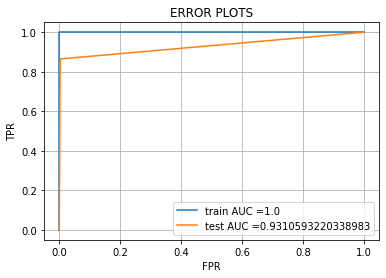

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


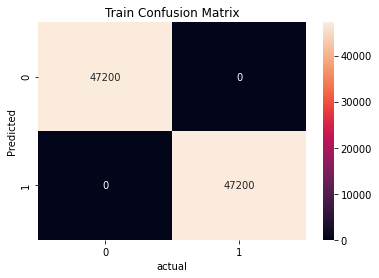

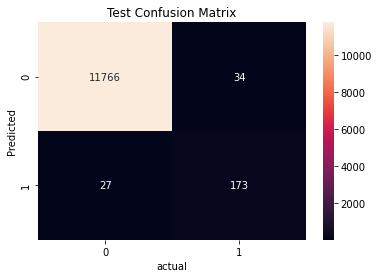

Train f1 score 1.0
Test f1 score 0.8501228501228502


In [106]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 93 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

In [107]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.84      0.86      0.85       200

    accuracy                           0.99     12000
   macro avg       0.92      0.93      0.92     12000
weighted avg       1.00      0.99      0.99     12000



## 4.2.9 XGBoost with SMOTE

In [108]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [109]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94400, 148)
After OverSampling, the shape of train_y: (94400,) 

After OverSampling, counts of label '1': 47200
After OverSampling, counts of label '0': 47200


In [110]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [111]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(n_estimators=1000,max_depth=7,
                                objective= 'binary:logistic',n_jobs=-1,reg_lambda=2.5)
XGClassifier_final.fit(X_train, y_train)




c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:04:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=2.5, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

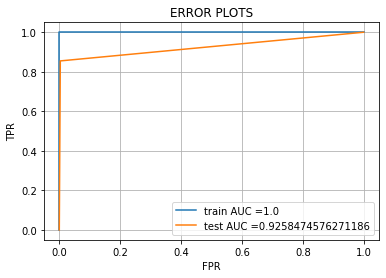

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


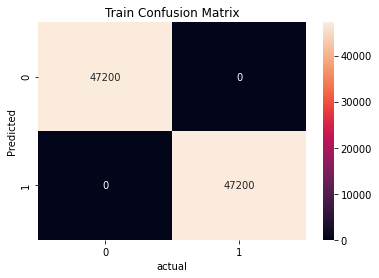

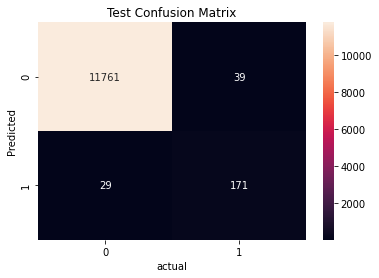

Train f1 score 1.0
Test f1 score 0.8341463414634146


In [112]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 93 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

In [113]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.81      0.85      0.83       200

    accuracy                           0.99     12000
   macro avg       0.91      0.93      0.92     12000
weighted avg       0.99      0.99      0.99     12000



## 4.2.10 XGBoost with SMOTE TOMEK

In [114]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [115]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
sm = SMOTETomek(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94394, 148)
After OverSampling, the shape of train_y: (94394,) 

After OverSampling, counts of label '1': 47197
After OverSampling, counts of label '0': 47197


In [116]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47197
47197


#### Apply ML Model with best parameters

In [117]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(n_estimators=1000,max_depth=7,
                                objective= 'binary:logistic',n_jobs=-1,reg_alpha=0.00001)

XGClassifier_final.fit(X_train, y_train)

c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:12:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=1e-05, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

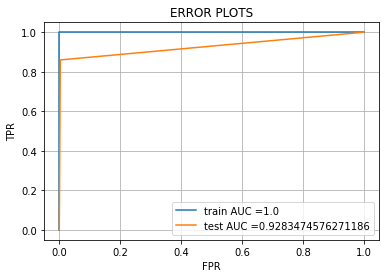

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


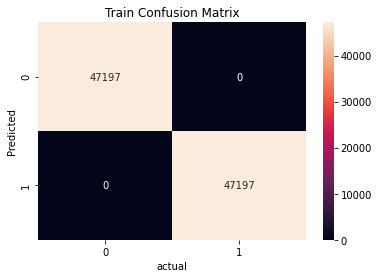

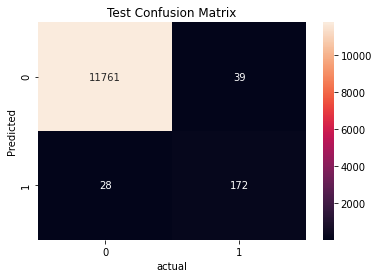

Train f1 score 1.0
Test f1 score 0.8369829683698298


In [118]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 93 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

In [119]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47197
         1.0       1.00      1.00      1.00     47197

    accuracy                           1.00     94394
   macro avg       1.00      1.00      1.00     94394
weighted avg       1.00      1.00      1.00     94394

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.82      0.86      0.84       200

    accuracy                           0.99     12000
   macro avg       0.91      0.93      0.92     12000
weighted avg       0.99      0.99      0.99     12000



## 4.2.11 Approach 2: Conclusion

In [2]:
from prettytable import PrettyTable
import math
    
Finaloutput = PrettyTable()
Finaloutput1 = PrettyTable()

Finaloutput.field_names = ["Model", "Sampling", "Train AUC Score", "Test AUC Score","Train F1 Score", "Test F1 Score", "Test F1 Macro Score"]

Finaloutput.add_row(["Random Forest","No Sampling",100,88,100,83,91])
Finaloutput.add_row(["Random Forest","ROS",100,84,99,75,87])
Finaloutput.add_row(["LGBMClassifier","No Sampling",100,93,100,84,92])
Finaloutput.add_row(["LGBMClassifier","ROS",100,94,100,81,90])
Finaloutput.add_row(["LGBMClassifier","SMOTE Over Sampling",100,94,100,83,91])
Finaloutput.add_row(["LGBMClassifier","SMOTE TOMEK Over Sampling",100,94,100,85,93])
Finaloutput.add_row(["XGBoost Classifier","No Sampling",100,90,100,85,93])
Finaloutput.add_row(["XGBoost Classifier","ROS",100,93,100,85,92])
Finaloutput.add_row(["XGBoost Classifier","SMOTE Over Sampling",100,93,100,83,92])
Finaloutput.add_row(["XGBoost Classifier","SMOTE TOMEK Over Sampling",100,93,100,84,92])



print(Finaloutput)

+--------------------+---------------------------+-----------------+----------------+----------------+---------------+---------------------+
|       Model        |          Sampling         | Train AUC Score | Test AUC Score | Train F1 Score | Test F1 Score | Test F1 Macro Score |
+--------------------+---------------------------+-----------------+----------------+----------------+---------------+---------------------+
|   Random Forest    |        No Sampling        |       100       |       88       |      100       |       83      |          91         |
|   Random Forest    |            ROS            |       100       |       84       |       99       |       75      |          87         |
|   LGBMClassifier   |        No Sampling        |       100       |       93       |      100       |       84      |          92         |
|   LGBMClassifier   |            ROS            |       100       |       94       |      100       |       81      |          90         |
|   LGBMClass

## Observations:
<p> XGBOOST with No Sampling and LGBMClassifier with SMOTE TOMEK Over Sampling has provided a best F1 Scores when compared with other ML models. 

LGBMClassifier with SMOTE TOMEK Over Sampling has provided best AUC scores. 
 </p>


# 4.3 Approach 3

Lets apply the following functionalities in the dataset and will proceed with applying ML models to predict the performance metric

        1) Remove unused features (>70% of data contains null values)
        2) Impute median for the missing values
        3) Apply Feature Engineering Techniques
        4) Drop Top 8 Least Features
        5) Remove columns which as high Skewness >50
        6) Remove once of the highly correlated features
        7) Split the data in to train and test and apply following sampling techniques to balance the Class Labels across Train and Test dataset.
            a) No Sampling with Normlization
            b) Random Over Sampler with Normlization
            c) SMOTE Oversampling  with Normlization
            d) SMOTE TOMEK with Normlization
        8) Apply ML Models for all sampling techniques
        

Have already implemented the functionalities from point 1 to point 2 in Approach 1. Lets consider the same dataset and implement from point 3.

### Apply Feature Engineering

Adding mean, Median, Std as a new features to the dataset

In [122]:
### Apply Feature Engineering

#Adding mean, Median, Std as a new features to the dataset
X_before_Normalization = EquipFail_train_dataset.copy()

Consider Highly Correlated features and add new features

In [123]:
#Lets add mean, median, standard deviation  to the dataset
X_before_Normalization['mean'] = X_before_Normalization[X_before_Normalization.columns[1:]].mean(axis=1)
X_before_Normalization['median'] = X_before_Normalization[X_before_Normalization.columns[1:]].median(axis=1)
#EquipFail_train_dataset['std'] = EquipFail_train_dataset[EquipFail_train_dataset.columns[1:]].std(axis=1)
X_before_Normalization["sensor32_measure'-'sensor8_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor8_measure"]
X_before_Normalization["sensor27_measure'-'sensor67_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor27_measure'-'sensor47_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor27_measure'-'sensor46_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor46_measure"]
X_before_Normalization["sensor92_measure'-'sensor93_measure"]=X_before_Normalization["sensor92_measure"]-X_before_Normalization["sensor93_measure"]
X_before_Normalization["sensor14_measure'-'sensor15_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor72_measure'-'sensor78_measure"]=X_before_Normalization["sensor72_measure"]-X_before_Normalization["sensor78_measure"]
X_before_Normalization["sensor95_measure'-'sensor94_measure"]=X_before_Normalization["sensor95_measure"]-X_before_Normalization["sensor94_measure"]
X_before_Normalization["sensor12_measure'-'sensor13_measure"]=X_before_Normalization["sensor12_measure"]-X_before_Normalization["sensor13_measure"]
X_before_Normalization["sensor89_measure'-'sensor33_measure"]=X_before_Normalization["sensor89_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor90_measure'-'sensor91_measure"]=X_before_Normalization["sensor90_measure"]-X_before_Normalization["sensor91_measure"]
X_before_Normalization["sensor27_measure'-'sensor14_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor14_measure"]
X_before_Normalization["sensor14_measure'-'sensor46_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor46_measure"]
X_before_Normalization["sensor14_measure'-'sensor67_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor14_measure'-'sensor47_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor32_measure'-'sensor14_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor14_measure"]
X_before_Normalization["sensor8_measure'-'sensor14_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor14_measure"]
X_before_Normalization["sensor97_measure'-'sensor96_measure"]=X_before_Normalization["sensor97_measure"]-X_before_Normalization["sensor96_measure"]
X_before_Normalization["sensor32_measure'-'sensor33_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor33_measure'-'sensor8_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor8_measure"]
X_before_Normalization["sensor1_measure'-'sensor45_measure"]=X_before_Normalization["sensor1_measure"]-X_before_Normalization["sensor45_measure"]
X_before_Normalization["sensor89_measure'-'sensor35_measure"]=X_before_Normalization["sensor89_measure"]-X_before_Normalization["sensor35_measure"]
X_before_Normalization["sensor14_measure'-'sensor33_measure"]=X_before_Normalization["sensor14_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor33_measure'-'sensor27_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor8_measure'-'sensor27_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor33_measure'-'sensor17_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor17_measure"]
X_before_Normalization["sensor15_measure'-'sensor27_measure"]=X_before_Normalization["sensor15_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor32_measure'-'sensor27_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor27_measure"]
X_before_Normalization["sensor67_measure'-'sensor33_measure"]=X_before_Normalization["sensor67_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor33_measure'-'sensor47_measure"]=X_before_Normalization["sensor33_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor46_measure'-'sensor33_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor8_measure'-'sensor46_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor46_measure"]
X_before_Normalization["sensor8_measure'-'sensor67_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor8_measure'-'sensor47_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor47_measure"]
X_before_Normalization["sensor46_measure'-'sensor15_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor15_measure'-'sensor67_measure"]=X_before_Normalization["sensor15_measure"]-X_before_Normalization["sensor67_measure"]
X_before_Normalization["sensor47_measure'-'sensor15_measure"]=X_before_Normalization["sensor47_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor46_measure'-'sensor89_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor67_measure'-'sensor89_measure"]=X_before_Normalization["sensor67_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor47_measure'-'sensor89_measure"]=X_before_Normalization["sensor47_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor46_measure'-'sensor32_measure"]=X_before_Normalization["sensor46_measure"]-X_before_Normalization["sensor32_measure"]
X_before_Normalization["sensor67_measure'-'sensor32_measure"]=X_before_Normalization["sensor67_measure"]-X_before_Normalization["sensor32_measure"]
X_before_Normalization["sensor47_measure'-'sensor32_measure"]=X_before_Normalization["sensor47_measure"]-X_before_Normalization["sensor32_measure"]
X_before_Normalization["sensor34_measure'-'sensor16_measure"]=X_before_Normalization["sensor34_measure"]-X_before_Normalization["sensor16_measure"]
X_before_Normalization["sensor32_measure'-'sensor15_measure"]=X_before_Normalization["sensor32_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor27_measure'-'sensor89_measure"]=X_before_Normalization["sensor27_measure"]-X_before_Normalization["sensor89_measure"]
X_before_Normalization["sensor8_measure'-'sensor15_measure"]=X_before_Normalization["sensor8_measure"]-X_before_Normalization["sensor15_measure"]
X_before_Normalization["sensor6_measure'-'sensor5_measure"]=X_before_Normalization["sensor6_measure"]-X_before_Normalization["sensor5_measure"]
X_before_Normalization["sensor35_measure'-'sensor33_measure"]=X_before_Normalization["sensor35_measure"]-X_before_Normalization["sensor33_measure"]
X_before_Normalization["sensor35_measure'-'sensor17_measure"]=X_before_Normalization["sensor35_measure"]-X_before_Normalization["sensor17_measure"]



Based on the Approach 1, listed out top 8 least features from all ML MOdels and will remove such features since these features doesn't useful for ML modelling

In [124]:
#rwemove least features from lgbt
#X_before_Normalization.drop(['sensor19_measure','sensor47_measure','sensor58_measure','sensor67_measure','sensor85_measure','sensor87_measure','sensor88_measure','sensor106_measure','sensor107_measure','sensor101_measure','sensor86_measure','sensor5_measure','sensor6_measure','sensor100_measure','sensor21_measure','sensor11_measure'], axis=1, inplace=True)


#least features XGBOOST and lgbt
X_before_Normalization.drop(['sensor101_measure','sensor106_measure','sensor107_measure','sensor11_measure','sensor85_measure','sensor86_measure','sensor87_measure','sensor88_measure'], axis=1, inplace=True)

#'sensor101_measure','sensor106_measure','sensor107_measure','sensor11_measure','sensor85_measure','sensor86_measure','sensor87_measure','sensor88_measure'

Remove columns which has more than 50 skewness

In [125]:
#Remove skewness >50

X_before_Normalization.drop(['sensor56_measure','sensor65_measure','sensor4_measure','sensor83_measure','sensor70_measure','sensor81_measure','sensor77_measure','sensor82_measure','sensor10_measure','sensor74_measure','sensor76_measure','sensor75_measure','sensor20_measure'], axis=1, inplace=True)



Lets find out highly correlated features each other and will keep one feature and remove another feature to predict the model better.

In [126]:
# Creating correlation matrix
cor_matrix = X_before_Normalization.corr().abs()
#print(); print(cor_matrix)

# Selecting upper triangle of correlation matrix
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),
                                  k=1).astype(np.bool))
#print(); print(upper_tri)

# Finding index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.95)]
print(); print(to_drop)

# Droping Marked Features
#df1 = X_before_Normalization.drop(X_before_Normalization.columns[to_drop], axis=1)
#print(); print(df1.head())


['sensor13_measure', 'sensor14_measure', 'sensor15_measure', 'sensor26_histogram_bin3', 'sensor26_histogram_bin4', 'sensor27_measure', 'sensor32_measure', 'sensor33_measure', 'sensor35_measure', 'sensor45_measure', 'sensor46_measure', 'sensor47_measure', 'sensor53_measure', 'sensor59_measure', 'sensor64_histogram_bin5', 'sensor67_measure', 'sensor89_measure', 'sensor95_measure', 'sensor105_histogram_bin4', "sensor27_measure'-'sensor47_measure", "sensor27_measure'-'sensor46_measure", "sensor92_measure'-'sensor93_measure", "sensor95_measure'-'sensor94_measure", "sensor12_measure'-'sensor13_measure", "sensor90_measure'-'sensor91_measure", "sensor27_measure'-'sensor14_measure", "sensor14_measure'-'sensor46_measure", "sensor14_measure'-'sensor67_measure", "sensor14_measure'-'sensor47_measure", "sensor32_measure'-'sensor14_measure", "sensor8_measure'-'sensor14_measure", "sensor97_measure'-'sensor96_measure", "sensor32_measure'-'sensor33_measure", "sensor33_measure'-'sensor8_measure", "senso

Above are the highly correlated features. Lets remove such features

In [127]:
# Droping Marked Features lgbt no features added

#X_before_Normalization.drop(['sensor13_measure', 'sensor14_measure', 'sensor15_measure', 'sensor27_measure', 'sensor32_measure', 'sensor33_measure', 'sensor35_measure', 'sensor45_measure', 'sensor46_measure', 'sensor53_measure', 'sensor56_measure', 'sensor59_measure', 'sensor65_measure', 'sensor89_measure', 'sensor95_measure'], axis=1, inplace=True)

#Drping feagtures after added new features and later removed highly correlated featreus

#X_before_Normalization.drop(['sensor33_measure', 'sensor35_measure', 'sensor59_measure', 'sensor65_measure', 'sensor89_measure', 'sensor95_measure', 'mean', "sensor27_measure'-'sensor47_measure", "sensor27_measure'-'sensor46_measure", "sensor92_measure'-'sensor93_measure", "sensor95_measure'-'sensor94_measure", "sensor90_measure'-'sensor91_measure", "sensor27_measure'-'sensor14_measure", "sensor14_measure'-'sensor46_measure", "sensor14_measure'-'sensor67_measure", "sensor14_measure'-'sensor47_measure", "sensor32_measure'-'sensor14_measure", "sensor8_measure'-'sensor14_measure", "sensor97_measure'-'sensor96_measure", "sensor32_measure'-'sensor33_measure", "sensor33_measure'-'sensor8_measure", "sensor89_measure'-'sensor35_measure", "sensor14_measure'-'sensor33_measure", "sensor33_measure'-'sensor27_measure", "sensor8_measure'-'sensor27_measure", "sensor33_measure'-'sensor17_measure", "sensor15_measure'-'sensor27_measure", "sensor32_measure'-'sensor27_measure", "sensor67_measure'-'sensor33_measure", "sensor33_measure'-'sensor47_measure", "sensor46_measure'-'sensor33_measure", "sensor8_measure'-'sensor46_measure", "sensor8_measure'-'sensor67_measure", "sensor8_measure'-'sensor47_measure", "sensor46_measure'-'sensor15_measure", "sensor15_measure'-'sensor67_measure", "sensor47_measure'-'sensor15_measure", "sensor46_measure'-'sensor89_measure", "sensor67_measure'-'sensor89_measure", "sensor47_measure'-'sensor89_measure", "sensor46_measure'-'sensor32_measure", "sensor67_measure'-'sensor32_measure", "sensor47_measure'-'sensor32_measure", "sensor34_measure'-'sensor16_measure", "sensor27_measure'-'sensor89_measure", "sensor8_measure'-'sensor15_measure", "sensor35_measure'-'sensor33_measure"], axis=1, inplace=True)

#applying everyting
X_before_Normalization.drop(['sensor13_measure', 'sensor14_measure', 'sensor15_measure', 'sensor27_measure', 'sensor32_measure', 'sensor33_measure', 'sensor35_measure', 'sensor45_measure', 'sensor46_measure', 'sensor47_measure', 'sensor53_measure', 'sensor59_measure', 'sensor67_measure', 'sensor89_measure', 'sensor95_measure', 'mean', "sensor27_measure'-'sensor47_measure", "sensor27_measure'-'sensor46_measure", "sensor92_measure'-'sensor93_measure", "sensor95_measure'-'sensor94_measure", "sensor12_measure'-'sensor13_measure", "sensor90_measure'-'sensor91_measure", "sensor27_measure'-'sensor14_measure", "sensor14_measure'-'sensor46_measure", "sensor14_measure'-'sensor67_measure", "sensor14_measure'-'sensor47_measure", "sensor32_measure'-'sensor14_measure", "sensor8_measure'-'sensor14_measure", "sensor97_measure'-'sensor96_measure", "sensor32_measure'-'sensor33_measure", "sensor33_measure'-'sensor8_measure", "sensor89_measure'-'sensor35_measure", "sensor14_measure'-'sensor33_measure", "sensor33_measure'-'sensor27_measure", "sensor8_measure'-'sensor27_measure", "sensor33_measure'-'sensor17_measure", "sensor15_measure'-'sensor27_measure", "sensor32_measure'-'sensor27_measure", "sensor67_measure'-'sensor33_measure", "sensor33_measure'-'sensor47_measure", "sensor46_measure'-'sensor33_measure", "sensor8_measure'-'sensor46_measure", "sensor8_measure'-'sensor67_measure", "sensor8_measure'-'sensor47_measure", "sensor46_measure'-'sensor15_measure", "sensor15_measure'-'sensor67_measure", "sensor47_measure'-'sensor15_measure", "sensor46_measure'-'sensor89_measure", "sensor67_measure'-'sensor89_measure", "sensor47_measure'-'sensor89_measure", "sensor46_measure'-'sensor32_measure", "sensor67_measure'-'sensor32_measure", "sensor47_measure'-'sensor32_measure", "sensor34_measure'-'sensor16_measure", "sensor27_measure'-'sensor89_measure", "sensor8_measure'-'sensor15_measure", "sensor35_measure'-'sensor33_measure"], axis=1, inplace=True)


<h2> Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [128]:
# extract data column project_is_approved from total_project_data and add it to variable y
# remove project_is_approved from total_project_data and store the data in to variable X
y = X_before_Normalization['target'].values
X_before_Normalization.drop(['target'], axis=1, inplace=True)
X = X_before_Normalization
X.head(1)

,sensor1_measure,sensor3_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,...,median,sensor32_measure'-'sensor8_measure,sensor27_measure'-'sensor67_measure,sensor14_measure'-'sensor15_measure,sensor72_measure'-'sensor78_measure,sensor89_measure'-'sensor33_measure,sensor1_measure'-'sensor45_measure,sensor32_measure'-'sensor15_measure,sensor6_measure'-'sensor5_measure,sensor35_measure'-'sensor17_measure
0,76698.0,2.130706e+09,0.0,0.0,0.0,0.0,0.0,0.0,37250.0,1432864.0,...,10842.0,0.0,0.0,1278130.0,-1207986.0,-35236.0,-0.08,-1103470.0,0.0,-332562.0


In [129]:
#split the data in to train and cross validation and test before performing BOW, TFIDF
# train test split
from sklearn.model_selection import train_test_split
#splitting data in to train and test with 33 percentage as test data
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, stratify=y,random_state=0)
#splitting train data in to train and cv with 33 percentage as cv data


### Apply Normalization

In [130]:
#normalize dataframe https://stackoverflow.com/questions/26414913/normalize-columns-of-pandas-data-frame

#X_norm = EquipFail_train_dataset.copy() #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler().fit(X_train1)
X_train1 = pd.DataFrame(min_max_scaler.transform(X_train1),columns=X_train1.columns)
X_test1 = pd.DataFrame(min_max_scaler.transform(X_test1),columns=X_test1.columns)
#X_normalized = min_max_scaler.fit_transform(X_norm)
#X_norm_final = pd.DataFrame(min_max_scaler.fit_transform(X_norm),columns=X_norm.columns)
X_train1

,sensor1_measure,sensor3_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,sensor7_histogram_bin5,...,median,sensor32_measure'-'sensor8_measure,sensor27_measure'-'sensor67_measure,sensor14_measure'-'sensor15_measure,sensor72_measure'-'sensor78_measure,sensor89_measure'-'sensor33_measure,sensor1_measure'-'sensor45_measure,sensor32_measure'-'sensor15_measure,sensor6_measure'-'sensor5_measure,sensor35_measure'-'sensor17_measure
0,0.394478,2.909833e-07,0.0,0.0,0.0,0.0,0.000279,0.023449,3.973444e-02,0.082411,...,0.164626,0.76532,0.29693,0.436526,0.992770,0.501224,0.029643,0.344773,0.267258,0.296792
1,0.014155,4.421068e-07,0.0,0.0,0.0,0.0,0.000000,0.000000,9.640320e-06,0.002355,...,0.006525,0.76532,0.29693,0.403998,0.973001,0.607827,0.029642,0.572571,0.267258,0.184444
2,0.000226,9.999998e-01,0.0,0.0,0.0,0.0,0.000000,0.000000,4.162905e-05,0.000273,...,0.000280,0.76532,0.29693,0.402227,0.999997,0.613239,0.029643,0.579592,0.267258,0.182781
3,0.024482,9.999998e-01,0.0,0.0,0.0,0.0,0.000000,0.000000,1.108244e-05,0.011030,...,0.002561,0.76532,0.29693,0.407466,0.999910,0.600697,0.029643,0.564471,0.267258,0.183796
4,0.016437,1.013748e-07,0.0,0.0,0.0,0.0,0.000000,0.000000,1.445087e-04,0.006769,...,0.008361,0.76532,0.29693,0.404122,0.998091,0.607473,0.029643,0.569669,0.267258,0.179982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47995,0.000711,7.133783e-08,0.0,0.0,0.0,0.0,0.000000,0.000000,3.938285e-05,0.000535,...,0.000127,0.76532,0.29693,0.402229,0.992770,0.613089,0.029642,0.579474,0.267258,0.182522
47996,0.013839,3.510572e-07,0.0,0.0,0.0,0.0,0.000000,0.000000,5.506257e-07,0.002384,...,0.005075,0.76532,0.29693,0.404035,0.998996,0.607268,0.029642,0.569348,0.267258,0.179936
47997,0.000307,1.220252e-08,0.0,0.0,0.0,0.0,0.000032,0.000630,8.942861e-05,0.000022,...,0.000205,0.76532,0.29693,0.402062,1.000000,0.613374,0.029642,0.579543,0.267258,0.182789
47998,0.170086,7.133783e-08,0.0,0.0,0.0,0.0,0.010339,0.054142,4.180504e-02,0.049804,...,0.329929,0.76532,0.29693,0.407803,0.857454,0.569542,0.029642,0.493638,0.267258,0.193433


In [131]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

## 4.3.1 Random Forest With No Sampling

#### Apply ML Model with best parameters

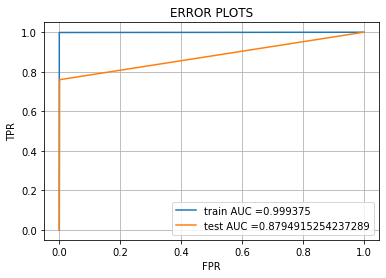

In [132]:
RFClass_Final = RandomForestClassifier(max_depth=200,n_estimators=1000,n_jobs=-1,random_state=0)
RFClass_Final.fit(X_train, y_train)

y_train_RFClass_pred = RFClass_Final.predict(X_train)
y_test_RFClass_pred = RFClass_Final.predict(X_test)

train_RFClass_fpr, train_RFClass_tpr, train_RFClass_thresholds = roc_curve(y_train, y_train_RFClass_pred)
test_RFClass_fpr, test_RFClass_tpr, test_RFClass_thresholds = roc_curve(y_test, y_test_RFClass_pred)

plt.plot(train_RFClass_fpr, train_RFClass_tpr, label="train AUC ="+str(auc(train_RFClass_fpr, train_RFClass_tpr)))
plt.plot(test_RFClass_fpr, test_RFClass_tpr, label="test AUC ="+str(auc(test_RFClass_fpr, test_RFClass_tpr)))
AUC_RFClass_Train = str(auc(train_RFClass_fpr, train_RFClass_tpr))
AUC_RFClass_Test = str(auc(test_RFClass_fpr, test_RFClass_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


## Observations:
<p>Train Accuray with Hyper Parameter ({'max_depth': 200, 'n_estimators': 1000}) is 100 %</p>
<p>Test Accuray with Hyper Parameter ({'max_depth': 200, 'n_estimators': 1000}) is 88 %</p>

#### Plot AUC, Confusion Matrix and F1 Scores

the maximum value of tpr*(1-fpr) 0.99875 for threshold 1.0


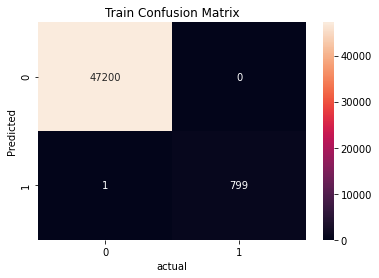

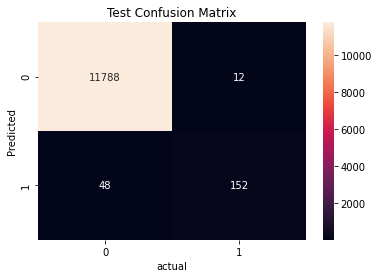

In [133]:
best_RFClass_t = find_best_threshold(train_RFClass_thresholds, train_RFClass_fpr, train_RFClass_tpr)
RFClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
RFClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


## Observations:
<p> Random Forest is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified </p>


In [134]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_RFClass_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_RFClass_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.93      0.76      0.84       200

    accuracy                           0.99     12000
   macro avg       0.96      0.88      0.92     12000
weighted avg       0.99      0.99      0.99     12000



In [135]:
F1_Score_RFClass_Train=f1_score(y_train,y_train_RFClass_pred)
F1_Score_RFClass_Test=f1_score(y_test,y_test_RFClass_pred)
print('Train f1 score',f1_score(y_train,y_train_RFClass_pred))
print('Test f1 score',f1_score(y_test,y_test_RFClass_pred))


Train f1 score 0.9993746091307067
Test f1 score 0.8351648351648352


### Feature Importance

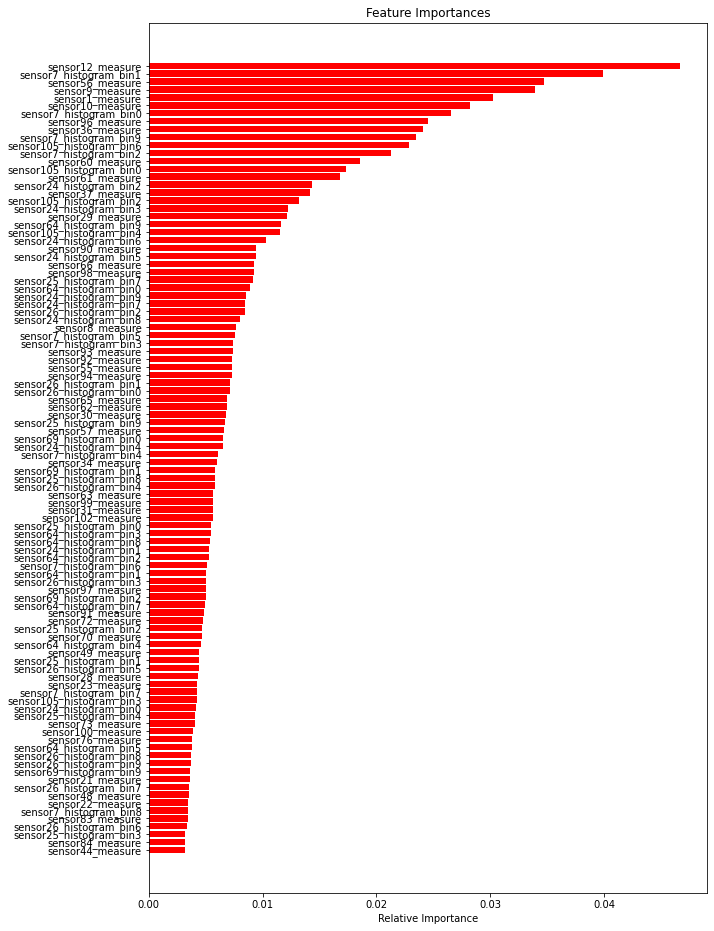

In [136]:
### Feature ImportanceRF_Train_features = X_train.columns
RF_importances = RFClass_Final.feature_importances_
RF_indices = (np.argsort(RF_importances))[-100:]
plt.figure(figsize=(10,16))
plt.title('Feature Importances')
plt.barh(range(len(RF_indices)), RF_importances[RF_indices], color='r', align='center')
plt.yticks(range(len(RF_indices)), [RF_Train_features[i] for i in RF_indices])
plt.xlabel('Relative Importance')
plt.show()

## 4.3.2 RandomForest with RandomOverSampler

In [137]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [138]:
#randomoversampler sklearn example https://imbalanced-learn.readthedocs.io/en/stable/over_sampling.html
#Perform Resampling only on Train data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_train).items()))

[(0.0, 47200), (1.0, 47200)]


In [139]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [140]:
from sklearn.ensemble import RandomForestClassifier

RFClass_Final = RandomForestClassifier(n_estimators=1000,n_jobs=-1)
#class_weight='balanced',max_depth=BestRFClassParam.get('max_depth'),n_estimators=BestRFClassParam.get('n_estimators')
RFClass_Final.fit(X_train, y_train)

y_train_RFClass_pred = RFClass_Final.predict(X_train)
y_test_RFClass_pred = RFClass_Final.predict(X_test)


#RFClass_Final = RandomForestClassifier(n_estimators=1000,n_jobs=-1)
#0.80

#### Plot AUC, Confusion Matrix and F1 Scores

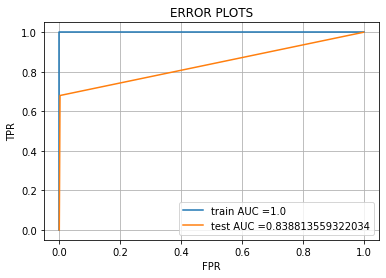

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


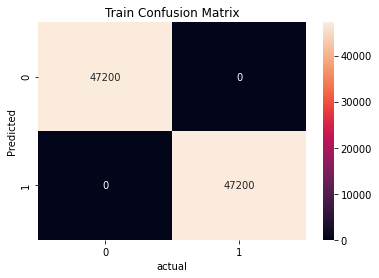

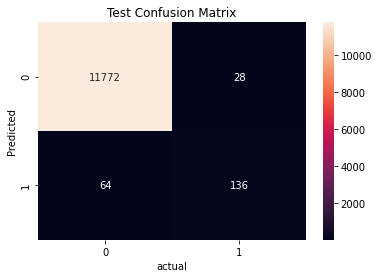

In [141]:

train_RFClass_fpr, train_RFClass_tpr, train_RFClass_thresholds = roc_curve(y_train, y_train_RFClass_pred)
test_RFClass_fpr, test_RFClass_tpr, test_RFClass_thresholds = roc_curve(y_test, y_test_RFClass_pred)

plt.plot(train_RFClass_fpr, train_RFClass_tpr, label="train AUC ="+str(auc(train_RFClass_fpr, train_RFClass_tpr)))
plt.plot(test_RFClass_fpr, test_RFClass_tpr, label="test AUC ="+str(auc(test_RFClass_fpr, test_RFClass_tpr)))
AUC_RFClass_Train = str(auc(train_RFClass_fpr, train_RFClass_tpr))
AUC_RFClass_Test = str(auc(test_RFClass_fpr, test_RFClass_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()
best_RFClass_t = find_best_threshold(train_RFClass_thresholds, train_RFClass_fpr, train_RFClass_tpr)
RFClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix
RFClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_RFClass_pred, best_RFClass_t))
df_cm1=pd.DataFrame(RFClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


### Observations:
<p>Train Accuray with Hyper Parameter (n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter ( n_estimators=1000) is 84 %</p>

Random Forest is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

In [142]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_RFClass_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_RFClass_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00     11800
         1.0       0.83      0.68      0.75       200

    accuracy                           0.99     12000
   macro avg       0.91      0.84      0.87     12000
weighted avg       0.99      0.99      0.99     12000



## 4.3.3 LIGHT GBM Classifer with No Sampler

#### Apply ML Model with best parameters

In [143]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [144]:
import lightgbm as lgb
clf1=lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, scale_pos_weight=59, silent=False,reg_lambda=0.28)
clf1.fit(X_train, y_train)



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Info] Number of positive: 800, number of negative: 47200
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32035
[LightGBM] [Info] Number of data points in the train set: 48000, number of used features: 133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, reg_lambda=0.28, scale_pos_weight=59,
               silent=False)

#### Plot AUC, Confusion Matrix and F1 Scores

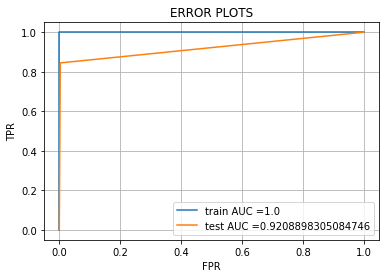

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


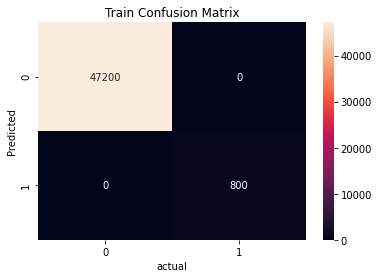

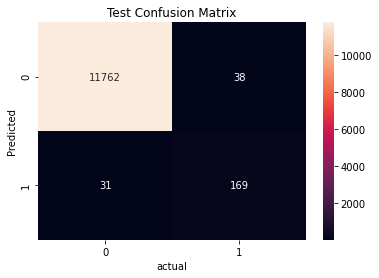

Train f1 score 1.0
Test f1 score 0.8304668304668306


In [145]:
y_train_pred = clf1.predict(X_train)
y_test_pred = clf1.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 93 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [146]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.82      0.84      0.83       200

    accuracy                           0.99     12000
   macro avg       0.91      0.92      0.91     12000
weighted avg       0.99      0.99      0.99     12000



## 4.3.4 LIGHT GBM With RandomOverSampler

In [147]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [148]:
#randomoversampler sklearn example https://imbalanced-learn.readthedocs.io/en/stable/over_sampling.html
#Perform Resampling only on Train data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_train).items()))

[(0.0, 47200), (1.0, 47200)]


In [149]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [150]:
import lightgbm as lgb
clf1 = lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
              n_estimators=200, num_leaves=300, objective='binary',
               random_state=0, reg_lambda=0.28)
clf1.fit(X_train, y_train)


[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt


LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
               n_estimators=200, num_leaves=300, objective='binary',
               random_state=0, reg_lambda=0.28)

#### Plot AUC, Confusion Matrix and F1 Scores

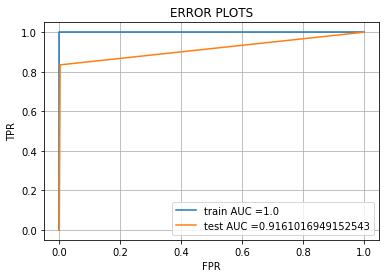

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


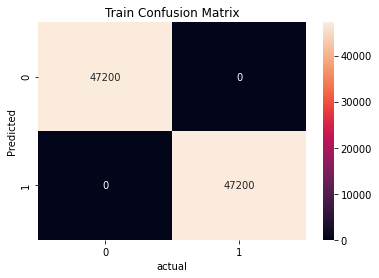

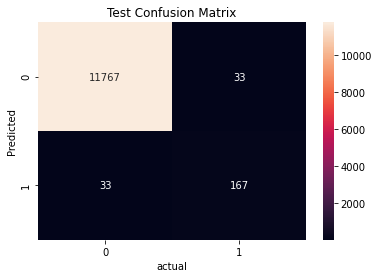

In [151]:
y_train_pred1 = clf1.predict(X_train)
y_test_pred1 = clf1.predict(X_test)



train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred1)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred1)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()




### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 92 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [152]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred1))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred1))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.83      0.83      0.83       200

    accuracy                           0.99     12000
   macro avg       0.92      0.92      0.92     12000
weighted avg       0.99      0.99      0.99     12000



## 4.3.5 LIGHT GBM With SMOTE

In [153]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [154]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94400, 135)
After OverSampling, the shape of train_y: (94400,) 

After OverSampling, counts of label '1': 47200
After OverSampling, counts of label '0': 47200


In [155]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [156]:
import lightgbm as lgb
clf1 = lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
              n_estimators=200, num_leaves=300, objective='binary',
               random_state=0, reg_lambda=0.28)
clf1.fit(X_train, y_train)

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt


LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
               n_estimators=200, num_leaves=300, objective='binary',
               random_state=0, reg_lambda=0.28)

#### Plot AUC, Confusion Matrix and F1 Scores

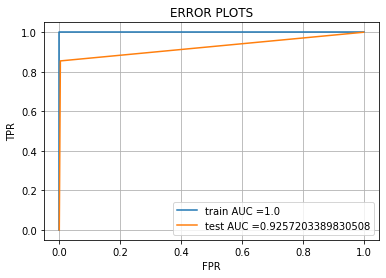

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


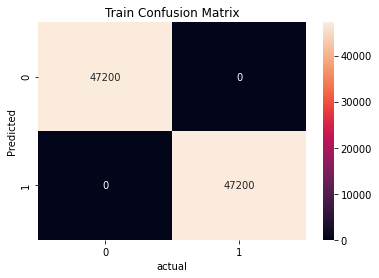

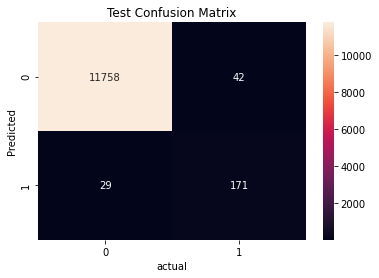

In [157]:
y_train_pred1 = clf1.predict(X_train)
y_test_pred1 = clf1.predict(X_test)


train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred1)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred1)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 93 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified

In [158]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred1))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred1))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.80      0.85      0.83       200

    accuracy                           0.99     12000
   macro avg       0.90      0.93      0.91     12000
weighted avg       0.99      0.99      0.99     12000



## 4.3.6 LIGHT GBM With SMOTE TOMEK

In [159]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [160]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
sm = SMOTETomek(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94394, 135)
After OverSampling, the shape of train_y: (94394,) 

After OverSampling, counts of label '1': 47197
After OverSampling, counts of label '0': 47197


In [161]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47197
47197


#### Apply ML Model with best parameters

In [162]:
import lightgbm as lgb
clf1 = lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
              n_estimators=200, num_leaves=300, objective='binary',
               random_state=0)
clf1.fit(X_train, y_train)

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt


LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=10,
               n_estimators=200, num_leaves=300, objective='binary',
               random_state=0)

#### Plot AUC, Confusion Matrix and F1 Scores

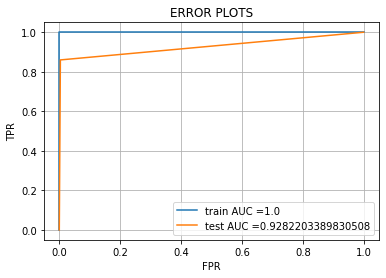

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


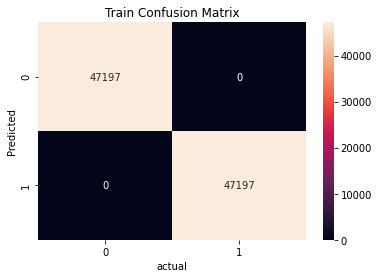

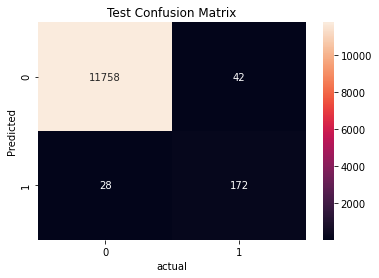

In [163]:
y_train_pred1 = clf1.predict(X_train)
y_test_pred1 = clf1.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred1)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred1)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred1, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=10, n_estimators=200) is 93 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [164]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred1))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred1))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47197
         1.0       1.00      1.00      1.00     47197

    accuracy                           1.00     94394
   macro avg       1.00      1.00      1.00     94394
weighted avg       1.00      1.00      1.00     94394

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.80      0.86      0.83       200

    accuracy                           0.99     12000
   macro avg       0.90      0.93      0.91     12000
weighted avg       0.99      0.99      0.99     12000



## 4.3.7 XGBOOST with No Sampling

In [165]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

#### Apply ML Model with best parameters

In [166]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(learning_rate =0.1,n_estimators=1000,max_depth=5,min_child_weight=1,gamma=0,subsample=0.8,colsample_bytree=0.8,objective= 'binary:logistic',nthread=4,scale_pos_weight=1,seed=27)



In [167]:
XGClassifier_final.fit(X_train, y_train )
                       #eval_metric=eval_metric, eval_set=eval_set, 
                       #verbose=True)

c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:25:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
              random_state=27, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=27, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

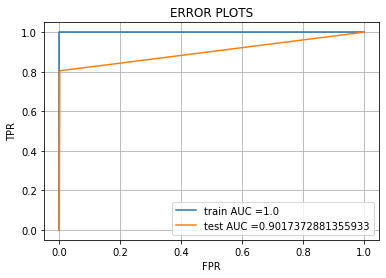

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


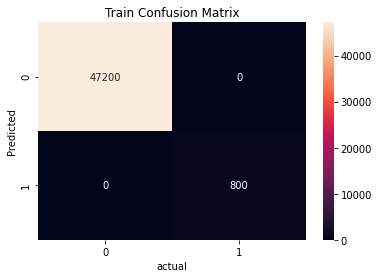

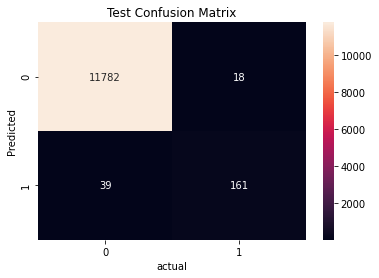

Train f1 score 1.0
Test f1 score 0.8496042216358839


In [168]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=5, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=5, n_estimators=1000) is 90 %</p>

XGBoost Classifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [169]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.90      0.81      0.85       200

    accuracy                           1.00     12000
   macro avg       0.95      0.90      0.92     12000
weighted avg       1.00      1.00      1.00     12000



### Feature Importance

In [170]:
# Feature importance

#lightGBM model fit
#gbm = lgb.LGBMClassifier()
#gbm.fit(train, target)
XGClassifier_final.feature_importances_

# importance of each attribute
fea_imp_ = pd.DataFrame({'cols':X_train.columns, 'fea_imp':XGClassifier_final.feature_importances_})
fea_imp_.loc[fea_imp_.fea_imp <0.004].sort_values(by=['cols'], ascending = True)

,cols,fea_imp
112,sensor102_measure,0.002236
113,sensor103_measure,0.003404
114,sensor104_measure,0.002641
115,sensor105_histogram_bin0,0.002976
116,sensor105_histogram_bin1,0.003158
...,...,...
100,sensor80_measure,0.002863
102,sensor90_measure,0.003908
105,sensor93_measure,0.002120
106,sensor94_measure,0.003338


## 4.3.8 XGBOOST with RandomOverSampler

In [171]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [172]:
#randomoversampler sklearn example https://imbalanced-learn.readthedocs.io/en/stable/over_sampling.html
#Perform Resampling only on Train data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_train).items()))

[(0.0, 47200), (1.0, 47200)]


In [173]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [174]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(n_estimators=1000,max_depth=7,random_state=0,
                                objective= 'binary:logistic',n_jobs=-1,reg_lambda=2.5)


XGClassifier_final.fit(X_train, y_train)



c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=2.5, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

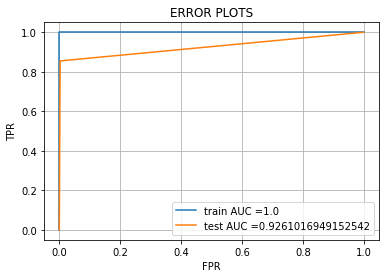

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


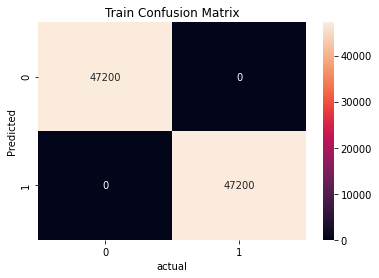

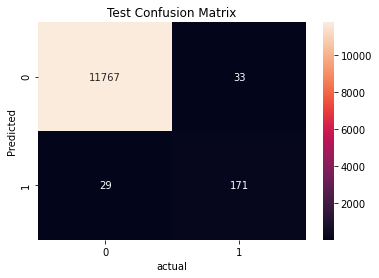

Train f1 score 1.0
Test f1 score 0.8465346534653465


In [175]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=7 n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 93 %</p>

XGBoost Classifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [176]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.84      0.85      0.85       200

    accuracy                           0.99     12000
   macro avg       0.92      0.93      0.92     12000
weighted avg       0.99      0.99      0.99     12000



## 4.3.9 XGBoost with SMOTE

In [177]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [178]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94400, 135)
After OverSampling, the shape of train_y: (94400,) 

After OverSampling, counts of label '1': 47200
After OverSampling, counts of label '0': 47200


In [179]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [180]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(n_estimators=1000,max_depth=7,random_state=0,
                                objective= 'binary:logistic',n_jobs=-1,reg_lambda=2.5)


XGClassifier_final.fit(X_train, y_train)



c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=2.5, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

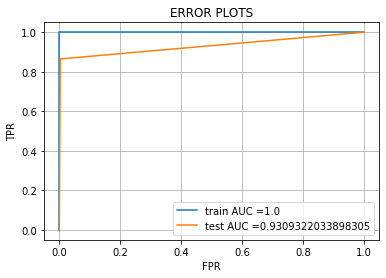

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


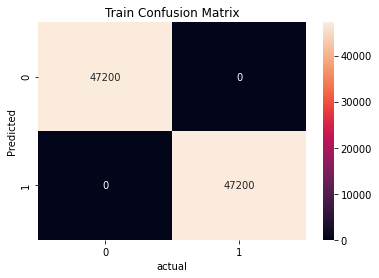

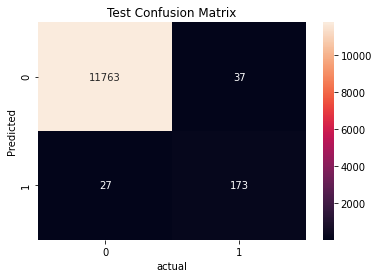

Train f1 score 1.0
Test f1 score 0.8439024390243902


In [181]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 93 %</p>

XGBoost Classifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [182]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.82      0.86      0.84       200

    accuracy                           0.99     12000
   macro avg       0.91      0.93      0.92     12000
weighted avg       0.99      0.99      0.99     12000



## 4.3.10 XGBoost with SMOTE TOMEK

In [183]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [184]:
#https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
sm = SMOTETomek(random_state = 0) 
X_train, y_train = sm.fit_sample(X_train, y_train) 

print('After OverSampling, the shape of train_X: {}'.format(X_train.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0))) 

After OverSampling, the shape of train_X: (94394, 135)
After OverSampling, the shape of train_y: (94394,) 

After OverSampling, counts of label '1': 47197
After OverSampling, counts of label '0': 47197


In [185]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47197
47197


#### Apply ML Model with best parameters

In [186]:
from xgboost import XGBClassifier
XGClassifier_final = XGBClassifier(n_estimators=1000,max_depth=7,
                                objective= 'binary:logistic',n_jobs=-1,reg_alpha=0.00001)


XGClassifier_final.fit(X_train, y_train)


c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:38:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=1e-05, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

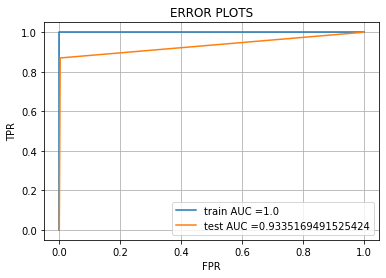

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


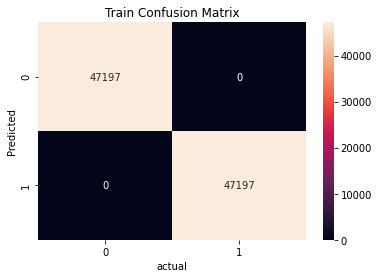

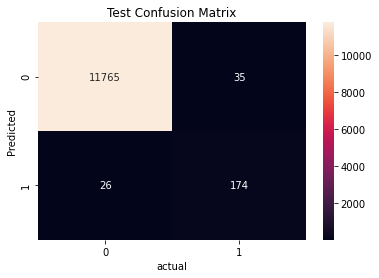

Train f1 score 1.0
Test f1 score 0.8508557457212714


In [187]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 93 %</p>

XGBoost Classifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [188]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47197
         1.0       1.00      1.00      1.00     47197

    accuracy                           1.00     94394
   macro avg       1.00      1.00      1.00     94394
weighted avg       1.00      1.00      1.00     94394

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.83      0.87      0.85       200

    accuracy                           0.99     12000
   macro avg       0.92      0.93      0.92     12000
weighted avg       1.00      0.99      0.99     12000



## 4.3.11 Approach 3: Conclusion

In [3]:
from prettytable import PrettyTable
import math
    
Finaloutput = PrettyTable()
Finaloutput1 = PrettyTable()

Finaloutput.field_names = ["Model", "Sampling", "Train AUC Score", "Test AUC Score","Train F1 Score", "Test F1 Score", "Test F1 Macro Score"]

Finaloutput.add_row(["Random Forest","No Sampling",100,88,100,84,92])
Finaloutput.add_row(["Random Forest","ROS",100,84,100,75,87])
Finaloutput.add_row(["LGBMClassifier","No Sampling",100,92,100,83,91])
Finaloutput.add_row(["LGBMClassifier","ROS",100,92,100,83,92])
Finaloutput.add_row(["LGBMClassifier","SMOTE Over Sampling",100,93,100,83,91])
Finaloutput.add_row(["LGBMClassifier","SMOTE TOMEK Over Sampling",100,93,100,83,91])
Finaloutput.add_row(["XGBoost Classifier","No Sampling",100,90,100,85,92])
Finaloutput.add_row(["XGBoost Classifier","ROS",100,93,100,85,92])
Finaloutput.add_row(["XGBoost Classifier","SMOTE Over Sampling",100,93,100,84,92])
Finaloutput.add_row(["XGBoost Classifier","SMOTE TOMEK Over Sampling",100,93,100,85,92])



print(Finaloutput)

+--------------------+---------------------------+-----------------+----------------+----------------+---------------+---------------------+
|       Model        |          Sampling         | Train AUC Score | Test AUC Score | Train F1 Score | Test F1 Score | Test F1 Macro Score |
+--------------------+---------------------------+-----------------+----------------+----------------+---------------+---------------------+
|   Random Forest    |        No Sampling        |       100       |       88       |      100       |       84      |          92         |
|   Random Forest    |            ROS            |       100       |       84       |      100       |       75      |          87         |
|   LGBMClassifier   |        No Sampling        |       100       |       92       |      100       |       83      |          91         |
|   LGBMClassifier   |            ROS            |       100       |       92       |      100       |       83      |          92         |
|   LGBMClass

## Observations:
<p> 
XGBoost with ROS Sampling and SMOTE TOMEK Over Sampling has provided best AUC (0.93) and F1 (0.85) scores when compared with other ML moelds.

 </p>


## 4.4 Approach 4

Lets apply the following functionalities in the dataset and will proceed with applying ML models to predict the performance metric

        1) Remove unused features (>70% of data contains null values)
        2) Impute median for the missing values
        3) Remove Top 8 least features and Apply Log Transformation
        4) Apply Feature Engineering Techniques
        5) Remove one of the highly correlated features between each other
        6) Apply Normlization on the dataset
        7) Apply ML Models
        

Have already implemented the functionalities of point 1 and 2 in Approach 1. Lets consider the same dataset and implement from point 3.

#### Remove Top 8 least features

In [191]:
X_before_Normalization = EquipFail_train_dataset.copy()

In [192]:
#rwemove least features 
X_before_Normalization.drop(['sensor101_measure','sensor106_measure','sensor107_measure','sensor11_measure','sensor85_measure','sensor86_measure','sensor87_measure','sensor88_measure'], axis=1, inplace=True)


## Log Normal Transformation

In [193]:

# Lets apply Log Normal distribution to reduce the skewness
#target_01_skew_old=[]
target_01_skew_old= pd.DataFrame()

target_01_skew_old=X_before_Normalization.iloc[:,1:].skew()

target_01_skew_old

sensor1_measure               6.115752
sensor3_measure               1.877413
sensor4_measure             244.948972
sensor5_measure              92.531591
sensor6_measure              52.780674
                               ...    
sensor105_histogram_bin5     14.635798
sensor105_histogram_bin6     10.353473
sensor105_histogram_bin7     15.803504
sensor105_histogram_bin8     13.491407
sensor105_histogram_bin9     29.369380
Length: 153, dtype: float64

In [194]:
# Lets apply Log Normal distribution to reduce the skewness
#target_01_skew_log=[]
target_01_skew_log= pd.DataFrame()
for skew_01_log_column in X_before_Normalization.columns[1:]:
    target_01_skew_log[skew_01_log_column]=np.log(X_before_Normalization[skew_01_log_column]+1)
#target_01_skew_log["target"]=1
target_01_skew_log1=target_01_skew_log.skew()

In [195]:
target_01_skew_log1

sensor1_measure            -0.835772
sensor3_measure             1.441372
sensor4_measure            -0.555298
sensor5_measure             7.531393
sensor6_measure             7.443812
                              ...   
sensor105_histogram_bin5   -1.153176
sensor105_histogram_bin6   -0.835094
sensor105_histogram_bin7   -0.731840
sensor105_histogram_bin8   -0.250353
sensor105_histogram_bin9    0.642720
Length: 153, dtype: float64

Compare skewness with original dataset columns and with Log Transformation columns. Add better skewness columns in to list

In [196]:
target_01_skew_log_list =[]
for skew_01_column in X_before_Normalization.columns[1:]:
    print ("new",target_01_skew_log1.loc[skew_01_column])
    print("old",target_01_skew_old.loc[skew_01_column])
    #print(min(target_01_skew_log1.loc[skew_01_column], target_01_skew_old.loc[skew_01_column], key=abs))
    if (min(target_01_skew_log1.loc[skew_01_column], target_01_skew_old.loc[skew_01_column], key=abs) != target_01_skew_old.loc[skew_01_column]):
        target_01_skew_log_list.append(skew_01_column)
        print("took new one")
target_01_skew_log_list

new -0.8357719762061686
old 6.115752483633122
took new one
new 1.4413721280351979
old 1.8774126527812818
took new one
new -0.5552979014791289
old 244.94897171343118
took new one
new 7.531392719766963
old 92.53159100748171
took new one
new 7.443812280536036
old 52.780673569245266
took new one
new 20.929485200604102
old 154.25252677874337
took new one
new 9.993442075019527
old 76.50493838191268
took new one
new 4.544559699663637
old 37.234884425469716
took new one
new 1.849191465102026
old 23.920528279733684
took new one
new 0.029935156181940627
old 22.411552773247667
took new one
new -1.3503399326683816
old 9.187471800643051
took new one
new -1.162480027591945
old 8.32014439540788
took new one
new -0.6779117368169029
old 12.442067302437392
took new one
new -0.09974350217950685
old 35.87180974584233
took new one
new 1.0813472242744069
old 98.84272313064412
took new one
new -0.7486923258903376
old 5.567375942050446
took new one
new 2.9501454437143986
old 47.70279928225477
took new one
new

['sensor1_measure',
 'sensor3_measure',
 'sensor4_measure',
 'sensor5_measure',
 'sensor6_measure',
 'sensor7_histogram_bin0',
 'sensor7_histogram_bin1',
 'sensor7_histogram_bin2',
 'sensor7_histogram_bin3',
 'sensor7_histogram_bin4',
 'sensor7_histogram_bin5',
 'sensor7_histogram_bin6',
 'sensor7_histogram_bin7',
 'sensor7_histogram_bin8',
 'sensor7_histogram_bin9',
 'sensor8_measure',
 'sensor9_measure',
 'sensor10_measure',
 'sensor12_measure',
 'sensor13_measure',
 'sensor14_measure',
 'sensor15_measure',
 'sensor16_measure',
 'sensor17_measure',
 'sensor18_measure',
 'sensor19_measure',
 'sensor20_measure',
 'sensor21_measure',
 'sensor22_measure',
 'sensor23_measure',
 'sensor24_histogram_bin0',
 'sensor24_histogram_bin1',
 'sensor24_histogram_bin2',
 'sensor24_histogram_bin3',
 'sensor24_histogram_bin4',
 'sensor24_histogram_bin5',
 'sensor24_histogram_bin6',
 'sensor24_histogram_bin7',
 'sensor24_histogram_bin8',
 'sensor24_histogram_bin9',
 'sensor25_histogram_bin0',
 'sensor2

Lets Apply Log transformation to the dataset as per above columns to reduce the skewness

In [197]:
for commonfeaturelistlength in range (len(target_01_skew_log_list)):
    X_before_Normalization[target_01_skew_log_list[commonfeaturelistlength]]=np.log(X_before_Normalization[target_01_skew_log_list[commonfeaturelistlength]]+1)
    print ("log transformation applied to column ",target_01_skew_log_list[commonfeaturelistlength])

log transformation applied to column  sensor1_measure
log transformation applied to column  sensor3_measure
log transformation applied to column  sensor4_measure
log transformation applied to column  sensor5_measure
log transformation applied to column  sensor6_measure
log transformation applied to column  sensor7_histogram_bin0
log transformation applied to column  sensor7_histogram_bin1
log transformation applied to column  sensor7_histogram_bin2
log transformation applied to column  sensor7_histogram_bin3
log transformation applied to column  sensor7_histogram_bin4
log transformation applied to column  sensor7_histogram_bin5
log transformation applied to column  sensor7_histogram_bin6
log transformation applied to column  sensor7_histogram_bin7
log transformation applied to column  sensor7_histogram_bin8
log transformation applied to column  sensor7_histogram_bin9
log transformation applied to column  sensor8_measure
log transformation applied to column  sensor9_measure
log transfor

<h2>Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [198]:
# extract data column project_is_approved from total_project_data and add it to variable y
# remove project_is_approved from total_project_data and store the data in to variable X
y = X_before_Normalization['target'].values
X_before_Normalization.drop(['target'], axis=1, inplace=True)
X = X_before_Normalization
X.head(1)

,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,11.247644,21.479719,5.638355,0.0,0.0,0.0,0.0,0.0,0.0,10.525434,...,13.780781,14.350195,14.031042,13.109045,13.488457,13.060047,12.734218,11.970078,11.201292,0.0


In [199]:
#split the data in to train and cross validation and test before performing BOW, TFIDF
# train test split
from sklearn.model_selection import train_test_split
#splitting data in to train and test with 33 percentage as test data
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.2, stratify=y,random_state=0)
#splitting train data in to train and cv with 33 percentage as cv data


### Apply Normalization

Normalization is a technique often applied as part of data preparation for machine learning. The goal of normalization is to change the values of numeric columns in the dataset to a common scale, without distorting differences in the ranges of values. 

In [200]:
#normalize dataframe https://stackoverflow.com/questions/26414913/normalize-columns-of-pandas-data-frame

#X_norm = EquipFail_train_dataset.copy() #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler().fit(X_train1)
X_train1 = pd.DataFrame(min_max_scaler.transform(X_train1),columns=X_train1.columns)
X_test1 = pd.DataFrame(min_max_scaler.transform(X_test1),columns=X_test1.columns)
#X_normalized = min_max_scaler.fit_transform(X_norm)
#X_norm_final = pd.DataFrame(min_max_scaler.fit_transform(X_norm),columns=X_norm.columns)
X_train1

,sensor1_measure,sensor3_measure,sensor4_measure,sensor5_measure,sensor6_measure,sensor7_histogram_bin0,sensor7_histogram_bin1,sensor7_histogram_bin2,sensor7_histogram_bin3,sensor7_histogram_bin4,...,sensor105_histogram_bin0,sensor105_histogram_bin1,sensor105_histogram_bin2,sensor105_histogram_bin3,sensor105_histogram_bin4,sensor105_histogram_bin5,sensor105_histogram_bin6,sensor105_histogram_bin7,sensor105_histogram_bin8,sensor105_histogram_bin9
0,0.937259,0.299414,0.397714,0.0,0.0,0.0,0.0,0.493893,0.791099,0.832427,...,0.857465,0.829042,0.786345,0.776578,0.782135,0.813033,0.878946,0.871723,0.783721,0.000000
1,0.712823,0.318862,0.558576,0.0,0.0,0.0,0.0,0.000000,0.000000,0.400000,...,0.713648,0.723191,0.720157,0.697249,0.687113,0.688558,0.681985,0.612076,0.736026,0.735184
2,0.434008,1.000000,0.241742,0.0,0.0,0.0,0.0,0.000000,0.000000,0.475979,...,0.577261,0.472301,0.402641,0.397906,0.465678,0.506665,0.516197,0.436921,0.000000,0.000000
3,0.749776,1.000000,0.534378,0.0,0.0,0.0,0.0,0.000000,0.000000,0.407239,...,0.791843,0.732131,0.688580,0.686885,0.687923,0.696473,0.727405,0.752793,0.751708,0.563264
4,0.722901,0.250464,0.430354,0.0,0.0,0.0,0.0,0.000000,0.000000,0.540632,...,0.701649,0.696854,0.684840,0.668909,0.669186,0.679331,0.698799,0.640831,0.796055,0.763318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47995,0.511075,0.234195,0.397714,0.0,0.0,0.0,0.0,0.000000,0.000000,0.473098,...,0.522140,0.491598,0.485887,0.483242,0.519717,0.620514,0.380625,0.181042,0.196486,0.000000
47996,0.711300,0.308139,0.528810,0.0,0.0,0.0,0.0,0.000000,0.000000,0.251666,...,0.708877,0.720233,0.706910,0.699315,0.706993,0.720631,0.718525,0.608631,0.554535,0.000000
47997,0.454566,0.153439,0.270592,0.0,0.0,0.0,0.0,0.360618,0.589780,0.515701,...,0.557187,0.478684,0.380419,0.345801,0.428803,0.455872,0.486268,0.539370,0.000000,0.000000
47998,0.880516,0.234195,0.397714,0.0,0.0,0.0,0.0,0.717296,0.837676,0.835066,...,0.815752,0.806275,0.800074,0.791513,0.788800,0.813146,0.891030,0.857696,0.579391,0.000000


In [201]:
from sklearn.model_selection import KFold
cv=KFold(n_splits=5,random_state=None, shuffle=False)

## 4.4.1 XGBOOST With Random Over Sampling

In [202]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

In [203]:
#randomoversampler sklearn example https://imbalanced-learn.readthedocs.io/en/stable/over_sampling.html
#Perform Resampling only on Train data
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state=0)
X_train, y_train = ros.fit_resample(X_train, y_train)
from collections import Counter
print(sorted(Counter(y_train).items()))

[(0.0, 47200), (1.0, 47200)]


In [204]:
i_class0_sampled = np.where(y_train == 0)[0]
i_class1_sampled = np.where(y_train == 1)[0]
print (len(i_class0_sampled))
print (len(i_class1_sampled))

47200
47200


#### Apply ML Model with best parameters

In [205]:
from xgboost import XGBClassifier
#XGClassifier_final = XGBClassifier(n_estimators=1000,reg_alpha=2,
#                                objective= 'binary:logistic',n_jobs=-1,random_state=0)
XGClassifier_final = XGBClassifier(n_estimators=1000,max_depth=7,
                                objective= 'binary:logistic',n_jobs=-1,reg_alpha=0.00001,random_state=0)

XGClassifier_final.fit(X_train, y_train)


c:\program files\python36\lib\site-packages\xgboost\sklearn.py:892: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[17:48:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1, random_state=0,
              reg_alpha=1e-05, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

#### Plot AUC, Confusion Matrix and F1 Scores

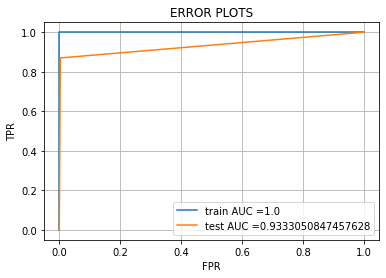

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


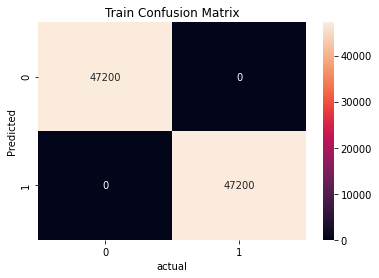

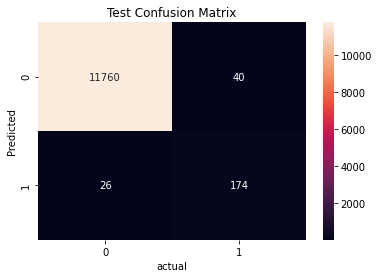

Train f1 score 1.0
Test f1 score 0.8405797101449274


In [206]:
y_train_pred = XGClassifier_final.predict(X_train)
y_test_pred = XGClassifier_final.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=7, n_estimators=1000) is 93 %</p>

XGBoost Classifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [207]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00     47200

    accuracy                           1.00     94400
   macro avg       1.00      1.00      1.00     94400
weighted avg       1.00      1.00      1.00     94400

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.81      0.87      0.84       200

    accuracy                           0.99     12000
   macro avg       0.91      0.93      0.92     12000
weighted avg       0.99      0.99      0.99     12000



## 4.4.2 LIGHT GBM With No Sampling

In [208]:
X_train, X_test, y_train, y_test=X_train1.copy(), X_test1.copy(), y_train1.copy(), y_test1.copy()

#### Apply ML Model with best parameters

In [209]:
import lightgbm as lgb
clf1=lgb.LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, scale_pos_weight=59, silent=False,reg_lambda=0.28)
clf1.fit(X_train, y_train)



[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Info] Number of positive: 800, number of negative: 47200
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36796
[LightGBM] [Info] Number of data points in the train set: 48000, number of used features: 151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

LGBMClassifier(boost_from_average=False, boosting='gbdt', max_depth=25,
               n_estimators=200, num_leaves=900, objective='binary',
               random_state=0, reg_lambda=0.28, scale_pos_weight=59,
               silent=False)

#### Plot AUC, Confusion Matrix and F1 Scores

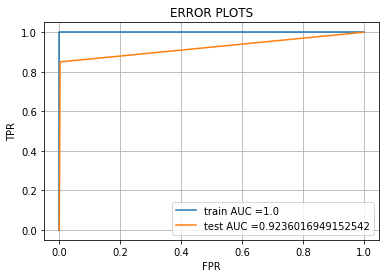

the maximum value of tpr*(1-fpr) 1.0 for threshold 1.0


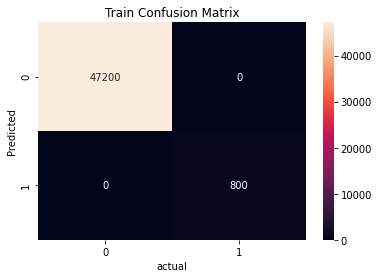

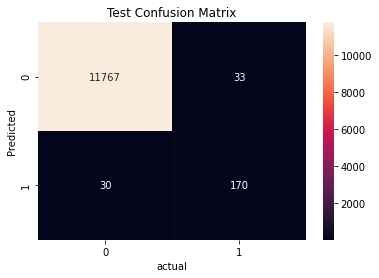

Train f1 score 1.0
Test f1 score 0.8436724565756824


In [210]:
y_train_pred = clf1.predict(X_train)
y_test_pred = clf1.predict(X_test)

train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
AUC_Train = str(auc(train_fpr, train_tpr))
AUC_Test = str(auc(test_fpr, test_tpr))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()


best_t = find_best_threshold(train_thresholds, train_fpr, train_tpr)
XGBoostClass_trainconfusion = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_trainconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()


XGBoostClass_Testconfusion = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))
df_cm1=pd.DataFrame(XGBoostClass_Testconfusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

from sklearn.metrics import f1_score

F1_Score_Train=f1_score(y_train,y_train_pred)
F1_Score_Test=f1_score(y_test,y_test_pred)
print('Train f1 score',f1_score(y_train,y_train_pred))
print('Test f1 score',f1_score(y_test,y_test_pred))



### Observations:
<p>Train Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 100 %</p>
<p>Test Accuray with Hyper Parameter (max_depth=25, n_estimators=200) is 92 %</p>

LGBMClassifier is sensible model as TPR and TNR rates are high when compared with FNR and FPR for Train and Test confusion matrix. However there are few points which are wrongly classified


In [211]:
from sklearn.metrics import classification_report
print ("Train Classification Report")
print(classification_report(y_train, y_train_pred))
print ("Test Classification Report")
print(classification_report(y_test, y_test_pred))

Train Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     47200
         1.0       1.00      1.00      1.00       800

    accuracy                           1.00     48000
   macro avg       1.00      1.00      1.00     48000
weighted avg       1.00      1.00      1.00     48000

Test Classification Report
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     11800
         1.0       0.84      0.85      0.84       200

    accuracy                           0.99     12000
   macro avg       0.92      0.92      0.92     12000
weighted avg       0.99      0.99      0.99     12000



## 4.4.3 Approach 4: Conclusion

In [4]:
from prettytable import PrettyTable
import math
    
Finaloutput = PrettyTable()
Finaloutput1 = PrettyTable()

Finaloutput.field_names = ["Model", "Sampling", "Train AUC Score", "Test AUC Score","Train F1 Score", "Test F1 Score", "Test F1 Macro Score"]

Finaloutput.add_row(["LGBMClassifier","No Sampling",100,93,100,84,92])
Finaloutput.add_row(["XGBoost Classifier","ROS",100,92,100,84,92])



print(Finaloutput)

+--------------------+-------------+-----------------+----------------+----------------+---------------+---------------------+
|       Model        |   Sampling  | Train AUC Score | Test AUC Score | Train F1 Score | Test F1 Score | Test F1 Macro Score |
+--------------------+-------------+-----------------+----------------+----------------+---------------+---------------------+
|   LGBMClassifier   | No Sampling |       100       |       93       |      100       |       84      |          92         |
| XGBoost Classifier |     ROS     |       100       |       92       |      100       |       84      |          92         |
+--------------------+-------------+-----------------+----------------+----------------+---------------+---------------------+


## 5. Overall Conclusion on F1 Score

Among 4 approaches, Second approach with LGBMClassifier (SMOTE TOMEK Over Sampling) has provided best Test F1Score (0.85%), F1 Macro Score ( 0.93), best Test AUC Score (0.94) when compared with other approaches and ML models.

Approach 3 of XGBOOSTClassifier with ROS & SMOTE TOMEK Over Sampling has provided next best results with Test F1 Score (0.85) and F1 Macro Score (0.92) when compared with other ML models.
